# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.992

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.993, 0.9931648527272046)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: tp6vpkwu
Name: swept-eon-124
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/tp6vpkwu
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120415-tp6vpkwu/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2546,3323,9374
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2546,2561,1678,3464,1648,3346
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4449,10794
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 659,786,2365
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 659,641,430,826,401,853
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1135,2675
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:17<2:58:11, 17.85s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:17<2:58:11, 17.85s/it, v_num=wu_1, total_loss_train=60.1, kl_local_train=30.6]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:17<2:58:11, 17.85s/it, v_num=wu_1, total_loss_train=60.1, kl_local_train=30.6]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:33<2:42:47, 16.33s/it, v_num=wu_1, total_loss_train=60.1, kl_local_train=30.6]

Epoch 2/600:   0%|▌                                                                                                                                                             | 2/600 [00:33<2:42:47, 16.33s/it, v_num=wu_1, total_loss_train=31.4, kl_local_train=43]

Epoch 3/600:   0%|▌                                                                                                                                                             | 2/600 [00:33<2:42:47, 16.33s/it, v_num=wu_1, total_loss_train=31.4, kl_local_train=43]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:48<2:37:54, 15.87s/it, v_num=wu_1, total_loss_train=31.4, kl_local_train=43]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:48<2:37:54, 15.87s/it, v_num=wu_1, total_loss_train=26.8, kl_local_train=35.9]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:48<2:37:54, 15.87s/it, v_num=wu_1, total_loss_train=26.8, kl_local_train=35.9]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [01:04<2:39:19, 16.04s/it, v_num=wu_1, total_loss_train=26.8, kl_local_train=35.9]

Epoch 4/600:   1%|█                                                                                                                                                             | 4/600 [01:04<2:39:19, 16.04s/it, v_num=wu_1, total_loss_train=25.7, kl_local_train=23]

Epoch 5/600:   1%|█                                                                                                                                                             | 4/600 [01:04<2:39:19, 16.04s/it, v_num=wu_1, total_loss_train=25.7, kl_local_train=23]

Epoch 5/600:   1%|█▎                                                                                                                                                            | 5/600 [01:21<2:40:27, 16.18s/it, v_num=wu_1, total_loss_train=25.7, kl_local_train=23]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:21<2:40:27, 16.18s/it, v_num=wu_1, total_loss_train=25.2, kl_local_train=13.8]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:22<2:40:27, 16.18s/it, v_num=wu_1, total_loss_train=25.2, kl_local_train=13.8]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:38<2:44:59, 16.67s/it, v_num=wu_1, total_loss_train=25.2, kl_local_train=13.8]

Epoch 6/600:   1%|▏                       | 6/600 [01:38<2:44:59, 16.67s/it, v_num=wu_1, total_loss_train=24.7, kl_local_train=11.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 7/600:   1%|▏                       | 6/600 [01:38<2:44:59, 16.67s/it, v_num=wu_1, total_loss_train=24.7, kl_local_train=11.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 7/600:   1%|▎                       | 7/600 [01:54<2:42:03, 16.40s/it, v_num=wu_1, total_loss_train=24.7, kl_local_train=11.6, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 7/600:   1%|▎                       | 7/600 [01:54<2:42:03, 16.40s/it, v_num=wu_1, total_loss_train=24.1, kl_local_train=13.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 8/600:   1%|▎                       | 7/600 [01:54<2:42:03, 16.40s/it, v_num=wu_1, total_loss_train=24.1, kl_local_train=13.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 8/600:   1%|▎                       | 8/600 [02:09<2:38:15, 16.04s/it, v_num=wu_1, total_loss_train=24.1, kl_local_train=13.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 8/600:   1%|▎                       | 8/600 [02:09<2:38:15, 16.04s/it, v_num=wu_1, total_loss_train=31.4, kl_local_train=15.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 9/600:   1%|▎                       | 8/600 [02:09<2:38:15, 16.04s/it, v_num=wu_1, total_loss_train=31.4, kl_local_train=15.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 9/600:   2%|▎                       | 9/600 [02:25<2:35:37, 15.80s/it, v_num=wu_1, total_loss_train=31.4, kl_local_train=15.8, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 9/600:   2%|▎                       | 9/600 [02:25<2:35:37, 15.80s/it, v_num=wu_1, total_loss_train=38.9, kl_local_train=19.9, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 10/600:   2%|▎                      | 9/600 [02:25<2:35:37, 15.80s/it, v_num=wu_1, total_loss_train=38.9, kl_local_train=19.9, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 10/600:   2%|▎                     | 10/600 [02:40<2:34:39, 15.73s/it, v_num=wu_1, total_loss_train=38.9, kl_local_train=19.9, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 10/600:   2%|▎                     | 10/600 [02:40<2:34:39, 15.73s/it, v_num=wu_1, total_loss_train=45.1, kl_local_train=49.3, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 11/600:   2%|▎                     | 10/600 [02:42<2:34:39, 15.73s/it, v_num=wu_1, total_loss_train=45.1, kl_local_train=49.3, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 11/600:   2%|▍                     | 11/600 [02:58<2:40:17, 16.33s/it, v_num=wu_1, total_loss_train=45.1, kl_local_train=49.3, metric_mi|status_control_train=0.0221, metric_mi|zone_train=0.00902, metric_mi|time_cat_train=0.0159, metric_mi|mouse_train=0.0373]

Epoch 11/600:   2%|▍                       | 11/600 [02:58<2:40:17, 16.33s/it, v_num=wu_1, total_loss_train=47.1, kl_local_train=87.8, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 12/600:   2%|▍                       | 11/600 [02:58<2:40:17, 16.33s/it, v_num=wu_1, total_loss_train=47.1, kl_local_train=87.8, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 12/600:   2%|▍                       | 12/600 [03:14<2:38:36, 16.18s/it, v_num=wu_1, total_loss_train=47.1, kl_local_train=87.8, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 12/600:   2%|▍                       | 12/600 [03:14<2:38:36, 16.18s/it, v_num=wu_1, total_loss_train=51.2, kl_local_train=95.9, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 13/600:   2%|▍                       | 12/600 [03:14<2:38:36, 16.18s/it, v_num=wu_1, total_loss_train=51.2, kl_local_train=95.9, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 13/600:   2%|▌                       | 13/600 [03:29<2:35:48, 15.93s/it, v_num=wu_1, total_loss_train=51.2, kl_local_train=95.9, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 13/600:   2%|▌                        | 13/600 [03:29<2:35:48, 15.93s/it, v_num=wu_1, total_loss_train=55.6, kl_local_train=100, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 14/600:   2%|▌                        | 13/600 [03:29<2:35:48, 15.93s/it, v_num=wu_1, total_loss_train=55.6, kl_local_train=100, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 14/600:   2%|▌                        | 14/600 [03:44<2:33:55, 15.76s/it, v_num=wu_1, total_loss_train=55.6, kl_local_train=100, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 14/600:   2%|▋                          | 14/600 [03:44<2:33:55, 15.76s/it, v_num=wu_1, total_loss_train=59, kl_local_train=126, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 15/600:   2%|▋                          | 14/600 [03:45<2:33:55, 15.76s/it, v_num=wu_1, total_loss_train=59, kl_local_train=126, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 15/600:   2%|▋                          | 15/600 [04:00<2:32:59, 15.69s/it, v_num=wu_1, total_loss_train=59, kl_local_train=126, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 15/600:   2%|▋                        | 15/600 [04:00<2:32:59, 15.69s/it, v_num=wu_1, total_loss_train=62.8, kl_local_train=139, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 16/600:   2%|▋                        | 15/600 [04:01<2:32:59, 15.69s/it, v_num=wu_1, total_loss_train=62.8, kl_local_train=139, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 16/600:   3%|▋                        | 16/600 [04:17<2:36:15, 16.05s/it, v_num=wu_1, total_loss_train=62.8, kl_local_train=139, metric_mi|status_control_train=0.0727, metric_mi|zone_train=0.0137, metric_mi|time_cat_train=0.0291, metric_mi|mouse_train=0.046]

Epoch 16/600:   3%|▋                           | 16/600 [04:17<2:36:15, 16.05s/it, v_num=wu_1, total_loss_train=66.9, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 17/600:   3%|▋                           | 16/600 [04:17<2:36:15, 16.05s/it, v_num=wu_1, total_loss_train=66.9, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 17/600:   3%|▊                           | 17/600 [04:32<2:34:08, 15.86s/it, v_num=wu_1, total_loss_train=66.9, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 17/600:   3%|▊                           | 17/600 [04:32<2:34:08, 15.86s/it, v_num=wu_1, total_loss_train=70.9, kl_local_train=147, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 18/600:   3%|▊                           | 17/600 [04:32<2:34:08, 15.86s/it, v_num=wu_1, total_loss_train=70.9, kl_local_train=147, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 18/600:   3%|▊                           | 18/600 [04:48<2:32:39, 15.74s/it, v_num=wu_1, total_loss_train=70.9, kl_local_train=147, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 18/600:   3%|▊                           | 18/600 [04:48<2:32:39, 15.74s/it, v_num=wu_1, total_loss_train=75.1, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 19/600:   3%|▊                           | 18/600 [04:48<2:32:39, 15.74s/it, v_num=wu_1, total_loss_train=75.1, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 19/600:   3%|▉                           | 19/600 [05:03<2:31:28, 15.64s/it, v_num=wu_1, total_loss_train=75.1, kl_local_train=146, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 19/600:   3%|▉                           | 19/600 [05:03<2:31:28, 15.64s/it, v_num=wu_1, total_loss_train=79.2, kl_local_train=152, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 20/600:   3%|▉                           | 19/600 [05:03<2:31:28, 15.64s/it, v_num=wu_1, total_loss_train=79.2, kl_local_train=152, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 20/600:   3%|▉                           | 20/600 [05:19<2:31:38, 15.69s/it, v_num=wu_1, total_loss_train=79.2, kl_local_train=152, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 20/600:   3%|▉                           | 20/600 [05:19<2:31:38, 15.69s/it, v_num=wu_1, total_loss_train=83.4, kl_local_train=150, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 21/600:   3%|▉                           | 20/600 [05:20<2:31:38, 15.69s/it, v_num=wu_1, total_loss_train=83.4, kl_local_train=150, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 21/600:   4%|▉                           | 21/600 [05:36<2:34:53, 16.05s/it, v_num=wu_1, total_loss_train=83.4, kl_local_train=150, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 21/600:   4%|█                            | 21/600 [05:36<2:34:53, 16.05s/it, v_num=wu_1, total_loss_train=87.7, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 22/600:   4%|█                            | 21/600 [05:36<2:34:53, 16.05s/it, v_num=wu_1, total_loss_train=87.7, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 22/600:   4%|█                            | 22/600 [05:51<2:33:18, 15.91s/it, v_num=wu_1, total_loss_train=87.7, kl_local_train=150, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 22/600:   4%|█                            | 22/600 [05:51<2:33:18, 15.91s/it, v_num=wu_1, total_loss_train=91.8, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 23/600:   4%|█                            | 22/600 [05:52<2:33:18, 15.91s/it, v_num=wu_1, total_loss_train=91.8, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 23/600:   4%|█                            | 23/600 [06:07<2:31:32, 15.76s/it, v_num=wu_1, total_loss_train=91.8, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 23/600:   4%|█▏                             | 23/600 [06:07<2:31:32, 15.76s/it, v_num=wu_1, total_loss_train=96, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 24/600:   4%|█▏                             | 23/600 [06:07<2:31:32, 15.76s/it, v_num=wu_1, total_loss_train=96, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 24/600:   4%|█▏                             | 24/600 [06:22<2:29:23, 15.56s/it, v_num=wu_1, total_loss_train=96, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 24/600:   4%|█▏                            | 24/600 [06:22<2:29:23, 15.56s/it, v_num=wu_1, total_loss_train=100, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 25/600:   4%|█▏                            | 24/600 [06:22<2:29:23, 15.56s/it, v_num=wu_1, total_loss_train=100, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 25/600:   4%|█▎                            | 25/600 [06:37<2:26:40, 15.30s/it, v_num=wu_1, total_loss_train=100, kl_local_train=149, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 25/600:   4%|█▎                            | 25/600 [06:37<2:26:40, 15.30s/it, v_num=wu_1, total_loss_train=104, kl_local_train=147, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 26/600:   4%|█▎                            | 25/600 [06:38<2:26:40, 15.30s/it, v_num=wu_1, total_loss_train=104, kl_local_train=147, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 26/600:   4%|█▎                            | 26/600 [06:54<2:30:55, 15.78s/it, v_num=wu_1, total_loss_train=104, kl_local_train=147, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 26/600:   4%|█▎                           | 26/600 [06:54<2:30:55, 15.78s/it, v_num=wu_1, total_loss_train=109, kl_local_train=147, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                           | 26/600 [06:54<2:30:55, 15.78s/it, v_num=wu_1, total_loss_train=109, kl_local_train=147, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                           | 27/600 [07:09<2:29:47, 15.68s/it, v_num=wu_1, total_loss_train=109, kl_local_train=147, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 27/600:   4%|█▎                           | 27/600 [07:09<2:29:47, 15.68s/it, v_num=wu_1, total_loss_train=113, kl_local_train=146, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 28/600:   4%|█▎                           | 27/600 [07:09<2:29:47, 15.68s/it, v_num=wu_1, total_loss_train=113, kl_local_train=146, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▎                           | 28/600 [07:24<2:28:48, 15.61s/it, v_num=wu_1, total_loss_train=113, kl_local_train=146, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 28/600:   5%|█▎                           | 28/600 [07:24<2:28:48, 15.61s/it, v_num=wu_1, total_loss_train=117, kl_local_train=147, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▎                           | 28/600 [07:24<2:28:48, 15.61s/it, v_num=wu_1, total_loss_train=117, kl_local_train=147, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                           | 29/600 [07:40<2:27:53, 15.54s/it, v_num=wu_1, total_loss_train=117, kl_local_train=147, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 29/600:   5%|█▍                           | 29/600 [07:40<2:27:53, 15.54s/it, v_num=wu_1, total_loss_train=122, kl_local_train=149, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 29/600 [07:40<2:27:53, 15.54s/it, v_num=wu_1, total_loss_train=122, kl_local_train=149, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 30/600 [07:55<2:27:21, 15.51s/it, v_num=wu_1, total_loss_train=122, kl_local_train=149, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 30/600:   5%|█▍                           | 30/600 [07:55<2:27:21, 15.51s/it, v_num=wu_1, total_loss_train=126, kl_local_train=148, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 30/600 [07:57<2:27:21, 15.51s/it, v_num=wu_1, total_loss_train=126, kl_local_train=148, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▍                           | 31/600 [08:12<2:30:52, 15.91s/it, v_num=wu_1, total_loss_train=126, kl_local_train=148, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 31/600:   5%|█▌                            | 31/600 [08:12<2:30:52, 15.91s/it, v_num=wu_1, total_loss_train=130, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 32/600:   5%|█▌                            | 31/600 [08:12<2:30:52, 15.91s/it, v_num=wu_1, total_loss_train=130, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 32/600:   5%|█▌                            | 32/600 [08:27<2:28:04, 15.64s/it, v_num=wu_1, total_loss_train=130, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 32/600:   5%|█▌                            | 32/600 [08:27<2:28:04, 15.64s/it, v_num=wu_1, total_loss_train=134, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 33/600:   5%|█▌                            | 32/600 [08:27<2:28:04, 15.64s/it, v_num=wu_1, total_loss_train=134, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 33/600:   6%|█▋                            | 33/600 [08:42<2:24:53, 15.33s/it, v_num=wu_1, total_loss_train=134, kl_local_train=148, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 33/600:   6%|█▋                            | 33/600 [08:42<2:24:53, 15.33s/it, v_num=wu_1, total_loss_train=138, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 34/600:   6%|█▋                            | 33/600 [08:42<2:24:53, 15.33s/it, v_num=wu_1, total_loss_train=138, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 34/600:   6%|█▋                            | 34/600 [08:58<2:27:06, 15.59s/it, v_num=wu_1, total_loss_train=138, kl_local_train=149, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 34/600:   6%|█▋                            | 34/600 [08:58<2:27:06, 15.59s/it, v_num=wu_1, total_loss_train=143, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 35/600:   6%|█▋                            | 34/600 [08:58<2:27:06, 15.59s/it, v_num=wu_1, total_loss_train=143, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 35/600:   6%|█▊                            | 35/600 [09:13<2:26:37, 15.57s/it, v_num=wu_1, total_loss_train=143, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 35/600:   6%|█▊                            | 35/600 [09:13<2:26:37, 15.57s/it, v_num=wu_1, total_loss_train=147, kl_local_train=152, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 36/600:   6%|█▊                            | 35/600 [09:15<2:26:37, 15.57s/it, v_num=wu_1, total_loss_train=147, kl_local_train=152, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 36/600:   6%|█▊                            | 36/600 [09:32<2:33:16, 16.31s/it, v_num=wu_1, total_loss_train=147, kl_local_train=152, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 36/600:   6%|█▊                            | 36/600 [09:32<2:33:16, 16.31s/it, v_num=wu_1, total_loss_train=151, kl_local_train=150, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 37/600:   6%|█▊                            | 36/600 [09:32<2:33:16, 16.31s/it, v_num=wu_1, total_loss_train=151, kl_local_train=150, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 37/600:   6%|█▊                            | 37/600 [09:47<2:30:50, 16.08s/it, v_num=wu_1, total_loss_train=151, kl_local_train=150, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 37/600:   6%|█▊                            | 37/600 [09:47<2:30:50, 16.08s/it, v_num=wu_1, total_loss_train=155, kl_local_train=153, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 38/600:   6%|█▊                            | 37/600 [09:47<2:30:50, 16.08s/it, v_num=wu_1, total_loss_train=155, kl_local_train=153, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 38/600:   6%|█▉                            | 38/600 [10:03<2:29:00, 15.91s/it, v_num=wu_1, total_loss_train=155, kl_local_train=153, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 38/600:   6%|█▉                            | 38/600 [10:03<2:29:00, 15.91s/it, v_num=wu_1, total_loss_train=160, kl_local_train=152, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 39/600:   6%|█▉                            | 38/600 [10:03<2:29:00, 15.91s/it, v_num=wu_1, total_loss_train=160, kl_local_train=152, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 39/600:   6%|█▉                            | 39/600 [10:18<2:27:36, 15.79s/it, v_num=wu_1, total_loss_train=160, kl_local_train=152, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 39/600:   6%|█▉                            | 39/600 [10:18<2:27:36, 15.79s/it, v_num=wu_1, total_loss_train=164, kl_local_train=150, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 40/600:   6%|█▉                            | 39/600 [10:18<2:27:36, 15.79s/it, v_num=wu_1, total_loss_train=164, kl_local_train=150, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 40/600:   7%|██                            | 40/600 [10:34<2:26:54, 15.74s/it, v_num=wu_1, total_loss_train=164, kl_local_train=150, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 40/600:   7%|██                            | 40/600 [10:34<2:26:54, 15.74s/it, v_num=wu_1, total_loss_train=168, kl_local_train=153, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 41/600:   7%|██                            | 40/600 [10:35<2:26:54, 15.74s/it, v_num=wu_1, total_loss_train=168, kl_local_train=153, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 41/600:   7%|██                            | 41/600 [10:51<2:30:10, 16.12s/it, v_num=wu_1, total_loss_train=168, kl_local_train=153, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 41/600:   7%|█▉                           | 41/600 [10:51<2:30:10, 16.12s/it, v_num=wu_1, total_loss_train=173, kl_local_train=152, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 42/600:   7%|█▉                           | 41/600 [10:51<2:30:10, 16.12s/it, v_num=wu_1, total_loss_train=173, kl_local_train=152, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 42/600:   7%|██                           | 42/600 [11:07<2:30:12, 16.15s/it, v_num=wu_1, total_loss_train=173, kl_local_train=152, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 42/600:   7%|██                           | 42/600 [11:07<2:30:12, 16.15s/it, v_num=wu_1, total_loss_train=177, kl_local_train=153, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 43/600:   7%|██                           | 42/600 [11:07<2:30:12, 16.15s/it, v_num=wu_1, total_loss_train=177, kl_local_train=153, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 43/600:   7%|██                           | 43/600 [11:23<2:30:32, 16.22s/it, v_num=wu_1, total_loss_train=177, kl_local_train=153, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 43/600:   7%|██                           | 43/600 [11:23<2:30:32, 16.22s/it, v_num=wu_1, total_loss_train=181, kl_local_train=153, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 44/600:   7%|██                           | 43/600 [11:23<2:30:32, 16.22s/it, v_num=wu_1, total_loss_train=181, kl_local_train=153, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 44/600:   7%|██▏                          | 44/600 [11:39<2:28:44, 16.05s/it, v_num=wu_1, total_loss_train=181, kl_local_train=153, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 44/600:   7%|██▏                          | 44/600 [11:39<2:28:44, 16.05s/it, v_num=wu_1, total_loss_train=185, kl_local_train=155, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 45/600:   7%|██▏                          | 44/600 [11:39<2:28:44, 16.05s/it, v_num=wu_1, total_loss_train=185, kl_local_train=155, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 45/600:   8%|██▏                          | 45/600 [11:56<2:30:16, 16.25s/it, v_num=wu_1, total_loss_train=185, kl_local_train=155, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 45/600:   8%|██▏                          | 45/600 [11:56<2:30:16, 16.25s/it, v_num=wu_1, total_loss_train=189, kl_local_train=154, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 46/600:   8%|██▏                          | 45/600 [11:57<2:30:16, 16.25s/it, v_num=wu_1, total_loss_train=189, kl_local_train=154, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 46/600:   8%|██▏                          | 46/600 [12:13<2:32:32, 16.52s/it, v_num=wu_1, total_loss_train=189, kl_local_train=154, metric_mi|status_control_train=0.262, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.201, metric_mi|mouse_train=0.148]

Epoch 46/600:   8%|██▎                           | 46/600 [12:13<2:32:32, 16.52s/it, v_num=wu_1, total_loss_train=194, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 47/600:   8%|██▎                           | 46/600 [12:13<2:32:32, 16.52s/it, v_num=wu_1, total_loss_train=194, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 47/600:   8%|██▎                           | 47/600 [12:29<2:32:16, 16.52s/it, v_num=wu_1, total_loss_train=194, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 47/600:   8%|██▎                           | 47/600 [12:29<2:32:16, 16.52s/it, v_num=wu_1, total_loss_train=198, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 48/600:   8%|██▎                           | 47/600 [12:29<2:32:16, 16.52s/it, v_num=wu_1, total_loss_train=198, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 48/600:   8%|██▍                           | 48/600 [12:48<2:36:58, 17.06s/it, v_num=wu_1, total_loss_train=198, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 48/600:   8%|██▍                           | 48/600 [12:48<2:36:58, 17.06s/it, v_num=wu_1, total_loss_train=202, kl_local_train=155, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 49/600:   8%|██▍                           | 48/600 [12:48<2:36:58, 17.06s/it, v_num=wu_1, total_loss_train=202, kl_local_train=155, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 49/600:   8%|██▍                           | 49/600 [13:07<2:42:58, 17.75s/it, v_num=wu_1, total_loss_train=202, kl_local_train=155, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 49/600:   8%|██▍                           | 49/600 [13:07<2:42:58, 17.75s/it, v_num=wu_1, total_loss_train=207, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 50/600:   8%|██▍                           | 49/600 [13:07<2:42:58, 17.75s/it, v_num=wu_1, total_loss_train=207, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 50/600:   8%|██▌                           | 50/600 [13:26<2:45:36, 18.07s/it, v_num=wu_1, total_loss_train=207, kl_local_train=154, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 50/600:   8%|██▌                           | 50/600 [13:26<2:45:36, 18.07s/it, v_num=wu_1, total_loss_train=211, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 51/600:   8%|██▌                           | 50/600 [13:27<2:45:36, 18.07s/it, v_num=wu_1, total_loss_train=211, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 51/600:   8%|██▌                           | 51/600 [13:45<2:47:04, 18.26s/it, v_num=wu_1, total_loss_train=211, kl_local_train=153, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 51/600:   8%|██▍                          | 51/600 [13:45<2:47:04, 18.26s/it, v_num=wu_1, total_loss_train=211, kl_local_train=154, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 52/600:   8%|██▍                          | 51/600 [13:45<2:47:04, 18.26s/it, v_num=wu_1, total_loss_train=211, kl_local_train=154, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 52/600:   9%|██▌                          | 52/600 [14:01<2:41:52, 17.72s/it, v_num=wu_1, total_loss_train=211, kl_local_train=154, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 52/600:   9%|██▌                          | 52/600 [14:01<2:41:52, 17.72s/it, v_num=wu_1, total_loss_train=211, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 53/600:   9%|██▌                          | 52/600 [14:01<2:41:52, 17.72s/it, v_num=wu_1, total_loss_train=211, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 53/600:   9%|██▌                          | 53/600 [14:17<2:36:53, 17.21s/it, v_num=wu_1, total_loss_train=211, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 53/600:   9%|██▌                          | 53/600 [14:17<2:36:53, 17.21s/it, v_num=wu_1, total_loss_train=211, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 54/600:   9%|██▌                          | 53/600 [14:17<2:36:53, 17.21s/it, v_num=wu_1, total_loss_train=211, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 54/600:   9%|██▌                          | 54/600 [14:33<2:33:14, 16.84s/it, v_num=wu_1, total_loss_train=211, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 54/600:   9%|██▌                          | 54/600 [14:33<2:33:14, 16.84s/it, v_num=wu_1, total_loss_train=211, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 55/600:   9%|██▌                          | 54/600 [14:33<2:33:14, 16.84s/it, v_num=wu_1, total_loss_train=211, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 55/600:   9%|██▋                          | 55/600 [14:50<2:32:31, 16.79s/it, v_num=wu_1, total_loss_train=211, kl_local_train=151, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 55/600:   9%|██▋                          | 55/600 [14:50<2:32:31, 16.79s/it, v_num=wu_1, total_loss_train=211, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 56/600:   9%|██▋                          | 55/600 [14:51<2:32:31, 16.79s/it, v_num=wu_1, total_loss_train=211, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 56/600:   9%|██▋                          | 56/600 [15:08<2:35:50, 17.19s/it, v_num=wu_1, total_loss_train=211, kl_local_train=150, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 56/600:   9%|██▊                           | 56/600 [15:08<2:35:50, 17.19s/it, v_num=wu_1, total_loss_train=212, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 57/600:   9%|██▊                           | 56/600 [15:08<2:35:50, 17.19s/it, v_num=wu_1, total_loss_train=212, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 57/600:  10%|██▊                           | 57/600 [15:25<2:35:40, 17.20s/it, v_num=wu_1, total_loss_train=212, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 57/600:  10%|██▊                           | 57/600 [15:25<2:35:40, 17.20s/it, v_num=wu_1, total_loss_train=212, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 58/600:  10%|██▊                           | 57/600 [15:25<2:35:40, 17.20s/it, v_num=wu_1, total_loss_train=212, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 58/600:  10%|██▉                           | 58/600 [15:41<2:33:14, 16.96s/it, v_num=wu_1, total_loss_train=212, kl_local_train=149, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 58/600:  10%|██▉                           | 58/600 [15:41<2:33:14, 16.96s/it, v_num=wu_1, total_loss_train=212, kl_local_train=148, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 59/600:  10%|██▉                           | 58/600 [15:41<2:33:14, 16.96s/it, v_num=wu_1, total_loss_train=212, kl_local_train=148, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 59/600:  10%|██▉                           | 59/600 [15:58<2:31:37, 16.82s/it, v_num=wu_1, total_loss_train=212, kl_local_train=148, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 59/600:  10%|██▉                           | 59/600 [15:58<2:31:37, 16.82s/it, v_num=wu_1, total_loss_train=211, kl_local_train=144, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 60/600:  10%|██▉                           | 59/600 [15:58<2:31:37, 16.82s/it, v_num=wu_1, total_loss_train=211, kl_local_train=144, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 60/600:  10%|███                           | 60/600 [16:15<2:32:15, 16.92s/it, v_num=wu_1, total_loss_train=211, kl_local_train=144, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 60/600:  10%|███                           | 60/600 [16:15<2:32:15, 16.92s/it, v_num=wu_1, total_loss_train=212, kl_local_train=142, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 61/600:  10%|███                           | 60/600 [16:17<2:32:15, 16.92s/it, v_num=wu_1, total_loss_train=212, kl_local_train=142, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 61/600:  10%|███                           | 61/600 [16:31<2:29:30, 16.64s/it, v_num=wu_1, total_loss_train=212, kl_local_train=142, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 61/600:  10%|██▉                          | 61/600 [16:31<2:29:30, 16.64s/it, v_num=wu_1, total_loss_train=212, kl_local_train=142, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 62/600:  10%|██▉                          | 61/600 [16:31<2:29:30, 16.64s/it, v_num=wu_1, total_loss_train=212, kl_local_train=142, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 62/600:  10%|██▉                          | 62/600 [16:46<2:25:36, 16.24s/it, v_num=wu_1, total_loss_train=212, kl_local_train=142, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 62/600:  10%|██▉                          | 62/600 [16:46<2:25:36, 16.24s/it, v_num=wu_1, total_loss_train=212, kl_local_train=141, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 63/600:  10%|██▉                          | 62/600 [16:46<2:25:36, 16.24s/it, v_num=wu_1, total_loss_train=212, kl_local_train=141, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 63/600:  10%|███                          | 63/600 [17:02<2:22:42, 15.95s/it, v_num=wu_1, total_loss_train=212, kl_local_train=141, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 63/600:  10%|███                          | 63/600 [17:02<2:22:42, 15.95s/it, v_num=wu_1, total_loss_train=212, kl_local_train=141, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 64/600:  10%|███                          | 63/600 [17:02<2:22:42, 15.95s/it, v_num=wu_1, total_loss_train=212, kl_local_train=141, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 64/600:  11%|███                          | 64/600 [17:17<2:20:33, 15.73s/it, v_num=wu_1, total_loss_train=212, kl_local_train=141, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 64/600:  11%|███                          | 64/600 [17:17<2:20:33, 15.73s/it, v_num=wu_1, total_loss_train=212, kl_local_train=140, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 65/600:  11%|███                          | 64/600 [17:17<2:20:33, 15.73s/it, v_num=wu_1, total_loss_train=212, kl_local_train=140, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 65/600:  11%|███▏                         | 65/600 [17:33<2:20:23, 15.74s/it, v_num=wu_1, total_loss_train=212, kl_local_train=140, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 65/600:  11%|███▏                         | 65/600 [17:33<2:20:23, 15.74s/it, v_num=wu_1, total_loss_train=212, kl_local_train=139, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 66/600:  11%|███▏                         | 65/600 [17:34<2:20:23, 15.74s/it, v_num=wu_1, total_loss_train=212, kl_local_train=139, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 66/600:  11%|███▏                         | 66/600 [17:49<2:22:35, 16.02s/it, v_num=wu_1, total_loss_train=212, kl_local_train=139, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.181, metric_mi|time_cat_train=0.206, metric_mi|mouse_train=0.151]

Epoch 66/600:  11%|███▏                         | 66/600 [17:49<2:22:35, 16.02s/it, v_num=wu_1, total_loss_train=213, kl_local_train=139, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 67/600:  11%|███▏                         | 66/600 [17:49<2:22:35, 16.02s/it, v_num=wu_1, total_loss_train=213, kl_local_train=139, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 67/600:  11%|███▏                         | 67/600 [18:05<2:20:48, 15.85s/it, v_num=wu_1, total_loss_train=213, kl_local_train=139, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 67/600:  11%|███▏                         | 67/600 [18:05<2:20:48, 15.85s/it, v_num=wu_1, total_loss_train=213, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 68/600:  11%|███▏                         | 67/600 [18:05<2:20:48, 15.85s/it, v_num=wu_1, total_loss_train=213, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 68/600:  11%|███▎                         | 68/600 [18:20<2:19:02, 15.68s/it, v_num=wu_1, total_loss_train=213, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 68/600:  11%|███▎                         | 68/600 [18:20<2:19:02, 15.68s/it, v_num=wu_1, total_loss_train=213, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 69/600:  11%|███▎                         | 68/600 [18:20<2:19:02, 15.68s/it, v_num=wu_1, total_loss_train=213, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 69/600:  12%|███▎                         | 69/600 [18:35<2:17:36, 15.55s/it, v_num=wu_1, total_loss_train=213, kl_local_train=138, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 69/600:  12%|███▎                         | 69/600 [18:35<2:17:36, 15.55s/it, v_num=wu_1, total_loss_train=213, kl_local_train=136, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 70/600:  12%|███▎                         | 69/600 [18:35<2:17:36, 15.55s/it, v_num=wu_1, total_loss_train=213, kl_local_train=136, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 70/600:  12%|███▍                         | 70/600 [18:52<2:19:30, 15.79s/it, v_num=wu_1, total_loss_train=213, kl_local_train=136, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 70/600:  12%|███▍                         | 70/600 [18:52<2:19:30, 15.79s/it, v_num=wu_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 71/600:  12%|███▍                         | 70/600 [18:53<2:19:30, 15.79s/it, v_num=wu_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 71/600:  12%|███▍                         | 71/600 [19:10<2:26:39, 16.63s/it, v_num=wu_1, total_loss_train=213, kl_local_train=135, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 71/600:  12%|███▍                         | 71/600 [19:10<2:26:39, 16.63s/it, v_num=wu_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 72/600:  12%|███▍                         | 71/600 [19:10<2:26:39, 16.63s/it, v_num=wu_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 72/600:  12%|███▍                         | 72/600 [19:28<2:28:13, 16.84s/it, v_num=wu_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 72/600:  12%|███▍                         | 72/600 [19:28<2:28:13, 16.84s/it, v_num=wu_1, total_loss_train=213, kl_local_train=134, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 73/600:  12%|███▍                         | 72/600 [19:28<2:28:13, 16.84s/it, v_num=wu_1, total_loss_train=213, kl_local_train=134, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 73/600:  12%|███▌                         | 73/600 [19:43<2:24:03, 16.40s/it, v_num=wu_1, total_loss_train=213, kl_local_train=134, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 73/600:  12%|███▌                         | 73/600 [19:43<2:24:03, 16.40s/it, v_num=wu_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 74/600:  12%|███▌                         | 73/600 [19:43<2:24:03, 16.40s/it, v_num=wu_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 74/600:  12%|███▌                         | 74/600 [19:58<2:20:54, 16.07s/it, v_num=wu_1, total_loss_train=213, kl_local_train=133, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 74/600:  12%|███▌                         | 74/600 [19:58<2:20:54, 16.07s/it, v_num=wu_1, total_loss_train=213, kl_local_train=132, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 75/600:  12%|███▌                         | 74/600 [19:58<2:20:54, 16.07s/it, v_num=wu_1, total_loss_train=213, kl_local_train=132, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 75/600:  12%|███▋                         | 75/600 [20:14<2:18:47, 15.86s/it, v_num=wu_1, total_loss_train=213, kl_local_train=132, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 75/600:  12%|███▋                         | 75/600 [20:14<2:18:47, 15.86s/it, v_num=wu_1, total_loss_train=213, kl_local_train=129, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 76/600:  12%|███▋                         | 75/600 [20:15<2:18:47, 15.86s/it, v_num=wu_1, total_loss_train=213, kl_local_train=129, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 76/600:  13%|███▋                         | 76/600 [20:30<2:20:37, 16.10s/it, v_num=wu_1, total_loss_train=213, kl_local_train=129, metric_mi|status_control_train=0.257, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 76/600:  13%|███▊                          | 76/600 [20:30<2:20:37, 16.10s/it, v_num=wu_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 77/600:  13%|███▊                          | 76/600 [20:30<2:20:37, 16.10s/it, v_num=wu_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 77/600:  13%|███▊                          | 77/600 [20:46<2:18:08, 15.85s/it, v_num=wu_1, total_loss_train=213, kl_local_train=128, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 77/600:  13%|███▊                          | 77/600 [20:46<2:18:08, 15.85s/it, v_num=wu_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 78/600:  13%|███▊                          | 77/600 [20:46<2:18:08, 15.85s/it, v_num=wu_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 78/600:  13%|███▉                          | 78/600 [21:01<2:16:29, 15.69s/it, v_num=wu_1, total_loss_train=214, kl_local_train=128, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 78/600:  13%|███▉                          | 78/600 [21:01<2:16:29, 15.69s/it, v_num=wu_1, total_loss_train=214, kl_local_train=127, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 79/600:  13%|███▉                          | 78/600 [21:01<2:16:29, 15.69s/it, v_num=wu_1, total_loss_train=214, kl_local_train=127, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 79/600:  13%|███▉                          | 79/600 [21:16<2:15:24, 15.59s/it, v_num=wu_1, total_loss_train=214, kl_local_train=127, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 79/600:  13%|███▉                          | 79/600 [21:16<2:15:24, 15.59s/it, v_num=wu_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 80/600:  13%|███▉                          | 79/600 [21:16<2:15:24, 15.59s/it, v_num=wu_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 80/600:  13%|████                          | 80/600 [21:32<2:15:29, 15.63s/it, v_num=wu_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 80/600:  13%|████                          | 80/600 [21:32<2:15:29, 15.63s/it, v_num=wu_1, total_loss_train=214, kl_local_train=126, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 81/600:  13%|████                          | 80/600 [21:33<2:15:29, 15.63s/it, v_num=wu_1, total_loss_train=214, kl_local_train=126, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 81/600:  14%|████                          | 81/600 [21:48<2:17:30, 15.90s/it, v_num=wu_1, total_loss_train=214, kl_local_train=126, metric_mi|status_control_train=0.254, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 81/600:  14%|███▉                         | 81/600 [21:48<2:17:30, 15.90s/it, v_num=wu_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|███▉                         | 81/600 [21:48<2:17:30, 15.90s/it, v_num=wu_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|███▉                         | 82/600 [22:03<2:14:41, 15.60s/it, v_num=wu_1, total_loss_train=214, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 82/600:  14%|███▉                         | 82/600 [22:03<2:14:41, 15.60s/it, v_num=wu_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|███▉                         | 82/600 [22:03<2:14:41, 15.60s/it, v_num=wu_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|████                         | 83/600 [22:18<2:11:20, 15.24s/it, v_num=wu_1, total_loss_train=214, kl_local_train=124, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 83/600:  14%|████                         | 83/600 [22:18<2:11:20, 15.24s/it, v_num=wu_1, total_loss_train=214, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|████                         | 83/600 [22:18<2:11:20, 15.24s/it, v_num=wu_1, total_loss_train=214, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|████                         | 84/600 [22:33<2:10:15, 15.15s/it, v_num=wu_1, total_loss_train=214, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 84/600:  14%|████                         | 84/600 [22:33<2:10:15, 15.15s/it, v_num=wu_1, total_loss_train=215, kl_local_train=121, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|████                         | 84/600 [22:33<2:10:15, 15.15s/it, v_num=wu_1, total_loss_train=215, kl_local_train=121, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|████                         | 85/600 [22:48<2:11:26, 15.31s/it, v_num=wu_1, total_loss_train=215, kl_local_train=121, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 85/600:  14%|████                         | 85/600 [22:48<2:11:26, 15.31s/it, v_num=wu_1, total_loss_train=214, kl_local_train=120, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|████                         | 85/600 [22:50<2:11:26, 15.31s/it, v_num=wu_1, total_loss_train=214, kl_local_train=120, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|████▏                        | 86/600 [23:08<2:21:05, 16.47s/it, v_num=wu_1, total_loss_train=214, kl_local_train=120, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 86/600:  14%|████▍                          | 86/600 [23:08<2:21:05, 16.47s/it, v_num=wu_1, total_loss_train=214, kl_local_train=118, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|████▍                          | 86/600 [23:08<2:21:05, 16.47s/it, v_num=wu_1, total_loss_train=214, kl_local_train=118, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|████▍                          | 87/600 [23:23<2:17:31, 16.09s/it, v_num=wu_1, total_loss_train=214, kl_local_train=118, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 87/600:  14%|████▍                          | 87/600 [23:23<2:17:31, 16.09s/it, v_num=wu_1, total_loss_train=214, kl_local_train=116, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 88/600:  14%|████▍                          | 87/600 [23:23<2:17:31, 16.09s/it, v_num=wu_1, total_loss_train=214, kl_local_train=116, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 88/600:  15%|████▌                          | 88/600 [23:38<2:16:21, 15.98s/it, v_num=wu_1, total_loss_train=214, kl_local_train=116, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 88/600:  15%|████▌                          | 88/600 [23:38<2:16:21, 15.98s/it, v_num=wu_1, total_loss_train=214, kl_local_train=115, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|████▌                          | 88/600 [23:39<2:16:21, 15.98s/it, v_num=wu_1, total_loss_train=214, kl_local_train=115, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|████▌                          | 89/600 [23:55<2:17:20, 16.13s/it, v_num=wu_1, total_loss_train=214, kl_local_train=115, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 89/600:  15%|████▌                          | 89/600 [23:55<2:17:20, 16.13s/it, v_num=wu_1, total_loss_train=214, kl_local_train=115, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|████▌                          | 89/600 [23:55<2:17:20, 16.13s/it, v_num=wu_1, total_loss_train=214, kl_local_train=115, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|████▋                          | 90/600 [24:10<2:15:20, 15.92s/it, v_num=wu_1, total_loss_train=214, kl_local_train=115, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 90/600:  15%|████▋                          | 90/600 [24:10<2:15:20, 15.92s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|████▋                          | 90/600 [24:12<2:15:20, 15.92s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|████▋                          | 91/600 [24:26<2:14:49, 15.89s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 91/600:  15%|████▌                         | 91/600 [24:26<2:14:49, 15.89s/it, v_num=wu_1, total_loss_train=215, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▌                         | 91/600 [24:26<2:14:49, 15.89s/it, v_num=wu_1, total_loss_train=215, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▌                         | 92/600 [24:42<2:13:23, 15.75s/it, v_num=wu_1, total_loss_train=215, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 92/600:  15%|████▌                         | 92/600 [24:42<2:13:23, 15.75s/it, v_num=wu_1, total_loss_train=215, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 93/600:  15%|████▌                         | 92/600 [24:42<2:13:23, 15.75s/it, v_num=wu_1, total_loss_train=215, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 93/600:  16%|████▋                         | 93/600 [24:57<2:11:52, 15.61s/it, v_num=wu_1, total_loss_train=215, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 93/600:  16%|████▋                         | 93/600 [24:57<2:11:52, 15.61s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▋                         | 93/600 [24:57<2:11:52, 15.61s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▋                         | 94/600 [25:12<2:10:39, 15.49s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 94/600:  16%|████▋                         | 94/600 [25:12<2:10:39, 15.49s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▋                         | 94/600 [25:12<2:10:39, 15.49s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▊                         | 95/600 [25:27<2:09:41, 15.41s/it, v_num=wu_1, total_loss_train=215, kl_local_train=112, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 95/600:  16%|████▊                         | 95/600 [25:27<2:09:41, 15.41s/it, v_num=wu_1, total_loss_train=216, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▊                         | 95/600 [25:29<2:09:41, 15.41s/it, v_num=wu_1, total_loss_train=216, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▊                         | 96/600 [25:44<2:12:43, 15.80s/it, v_num=wu_1, total_loss_train=216, kl_local_train=113, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 96/600:  16%|████▋                        | 96/600 [25:44<2:12:43, 15.80s/it, v_num=wu_1, total_loss_train=215, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 97/600:  16%|████▋                        | 96/600 [25:44<2:12:43, 15.80s/it, v_num=wu_1, total_loss_train=215, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 97/600:  16%|████▋                        | 97/600 [25:59<2:11:01, 15.63s/it, v_num=wu_1, total_loss_train=215, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 97/600:  16%|████▋                        | 97/600 [25:59<2:11:01, 15.63s/it, v_num=wu_1, total_loss_train=216, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 98/600:  16%|████▋                        | 97/600 [25:59<2:11:01, 15.63s/it, v_num=wu_1, total_loss_train=216, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 98/600:  16%|████▋                        | 98/600 [26:15<2:10:10, 15.56s/it, v_num=wu_1, total_loss_train=216, kl_local_train=112, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 98/600:  16%|████▋                        | 98/600 [26:15<2:10:10, 15.56s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 99/600:  16%|████▋                        | 98/600 [26:15<2:10:10, 15.56s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 99/600:  16%|████▊                        | 99/600 [26:30<2:09:10, 15.47s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 99/600:  16%|████▊                        | 99/600 [26:30<2:09:10, 15.47s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 100/600:  16%|████▌                       | 99/600 [26:30<2:09:10, 15.47s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 100/600:  17%|████▌                      | 100/600 [26:46<2:09:19, 15.52s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 100/600:  17%|████▌                      | 100/600 [26:46<2:09:19, 15.52s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 101/600:  17%|████▌                      | 100/600 [26:47<2:09:19, 15.52s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 101/600:  17%|████▌                      | 101/600 [27:02<2:11:58, 15.87s/it, v_num=wu_1, total_loss_train=216, kl_local_train=111, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 101/600:  17%|████▌                      | 101/600 [27:02<2:11:58, 15.87s/it, v_num=wu_1, total_loss_train=216, kl_local_train=110, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 101/600 [27:02<2:11:58, 15.87s/it, v_num=wu_1, total_loss_train=216, kl_local_train=110, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 102/600 [27:18<2:10:11, 15.69s/it, v_num=wu_1, total_loss_train=216, kl_local_train=110, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 102/600 [27:18<2:10:11, 15.69s/it, v_num=wu_1, total_loss_train=216, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▌                      | 102/600 [27:18<2:10:11, 15.69s/it, v_num=wu_1, total_loss_train=216, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▋                      | 103/600 [27:33<2:08:51, 15.56s/it, v_num=wu_1, total_loss_train=216, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▋                      | 103/600 [27:33<2:08:51, 15.56s/it, v_num=wu_1, total_loss_train=216, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 103/600 [27:33<2:08:51, 15.56s/it, v_num=wu_1, total_loss_train=216, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 104/600 [27:48<2:07:51, 15.47s/it, v_num=wu_1, total_loss_train=216, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 104/600 [27:48<2:07:51, 15.47s/it, v_num=wu_1, total_loss_train=216, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 105/600:  17%|████▋                      | 104/600 [27:48<2:07:51, 15.47s/it, v_num=wu_1, total_loss_train=216, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|████▋                      | 105/600 [28:04<2:08:17, 15.55s/it, v_num=wu_1, total_loss_train=216, kl_local_train=109, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|████▋                      | 105/600 [28:04<2:08:17, 15.55s/it, v_num=wu_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▋                      | 105/600 [28:05<2:08:17, 15.55s/it, v_num=wu_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▊                      | 106/600 [28:20<2:10:44, 15.88s/it, v_num=wu_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▊                      | 106/600 [28:20<2:10:44, 15.88s/it, v_num=wu_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 107/600:  18%|████▊                      | 106/600 [28:20<2:10:44, 15.88s/it, v_num=wu_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 107/600:  18%|████▊                      | 107/600 [28:36<2:09:00, 15.70s/it, v_num=wu_1, total_loss_train=217, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 107/600:  18%|████▊                      | 107/600 [28:36<2:09:00, 15.70s/it, v_num=wu_1, total_loss_train=217, kl_local_train=107, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 108/600:  18%|████▊                      | 107/600 [28:36<2:09:00, 15.70s/it, v_num=wu_1, total_loss_train=217, kl_local_train=107, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 108/600:  18%|████▊                      | 108/600 [28:51<2:07:41, 15.57s/it, v_num=wu_1, total_loss_train=217, kl_local_train=107, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 108/600:  18%|████▊                      | 108/600 [28:51<2:07:41, 15.57s/it, v_num=wu_1, total_loss_train=217, kl_local_train=106, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 109/600:  18%|████▊                      | 108/600 [28:51<2:07:41, 15.57s/it, v_num=wu_1, total_loss_train=217, kl_local_train=106, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 109/600:  18%|████▉                      | 109/600 [29:06<2:06:36, 15.47s/it, v_num=wu_1, total_loss_train=217, kl_local_train=106, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 109/600:  18%|████▉                      | 109/600 [29:06<2:06:36, 15.47s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 110/600:  18%|████▉                      | 109/600 [29:06<2:06:36, 15.47s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 110/600:  18%|████▉                      | 110/600 [29:22<2:07:41, 15.64s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 110/600:  18%|████▉                      | 110/600 [29:22<2:07:41, 15.64s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 111/600:  18%|████▉                      | 110/600 [29:24<2:07:41, 15.64s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 111/600:  18%|████▉                      | 111/600 [29:40<2:11:31, 16.14s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 111/600:  18%|████▉                      | 111/600 [29:40<2:11:31, 16.14s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 112/600:  18%|████▉                      | 111/600 [29:40<2:11:31, 16.14s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 112/600:  19%|█████                      | 112/600 [29:57<2:14:25, 16.53s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 112/600:  19%|█████                      | 112/600 [29:57<2:14:25, 16.53s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 113/600:  19%|█████                      | 112/600 [29:57<2:14:25, 16.53s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 113/600:  19%|█████                      | 113/600 [30:12<2:10:57, 16.13s/it, v_num=wu_1, total_loss_train=217, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 113/600:  19%|█████                      | 113/600 [30:12<2:10:57, 16.13s/it, v_num=wu_1, total_loss_train=217, kl_local_train=104, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 114/600:  19%|█████                      | 113/600 [30:12<2:10:57, 16.13s/it, v_num=wu_1, total_loss_train=217, kl_local_train=104, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 114/600:  19%|█████▏                     | 114/600 [30:27<2:06:44, 15.65s/it, v_num=wu_1, total_loss_train=217, kl_local_train=104, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 114/600:  19%|█████▏                     | 114/600 [30:27<2:06:44, 15.65s/it, v_num=wu_1, total_loss_train=217, kl_local_train=104, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 115/600:  19%|█████▏                     | 114/600 [30:27<2:06:44, 15.65s/it, v_num=wu_1, total_loss_train=217, kl_local_train=104, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 115/600:  19%|█████▏                     | 115/600 [30:43<2:07:18, 15.75s/it, v_num=wu_1, total_loss_train=217, kl_local_train=104, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 115/600:  19%|█████▏                     | 115/600 [30:43<2:07:18, 15.75s/it, v_num=wu_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 116/600:  19%|█████▏                     | 115/600 [30:44<2:07:18, 15.75s/it, v_num=wu_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 116/600:  19%|█████▏                     | 116/600 [31:00<2:10:39, 16.20s/it, v_num=wu_1, total_loss_train=218, kl_local_train=105, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 116/600:  19%|█████▏                     | 116/600 [31:00<2:10:39, 16.20s/it, v_num=wu_1, total_loss_train=218, kl_local_train=104, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 117/600:  19%|█████▏                     | 116/600 [31:00<2:10:39, 16.20s/it, v_num=wu_1, total_loss_train=218, kl_local_train=104, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 117/600:  20%|█████▎                     | 117/600 [31:17<2:11:43, 16.36s/it, v_num=wu_1, total_loss_train=218, kl_local_train=104, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 117/600:  20%|█████▎                     | 117/600 [31:17<2:11:43, 16.36s/it, v_num=wu_1, total_loss_train=218, kl_local_train=103, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 118/600:  20%|█████▎                     | 117/600 [31:17<2:11:43, 16.36s/it, v_num=wu_1, total_loss_train=218, kl_local_train=103, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 118/600:  20%|█████▎                     | 118/600 [31:32<2:09:41, 16.14s/it, v_num=wu_1, total_loss_train=218, kl_local_train=103, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 118/600:  20%|█████▎                     | 118/600 [31:32<2:09:41, 16.14s/it, v_num=wu_1, total_loss_train=218, kl_local_train=102, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 119/600:  20%|█████▎                     | 118/600 [31:32<2:09:41, 16.14s/it, v_num=wu_1, total_loss_train=218, kl_local_train=102, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 119/600:  20%|█████▎                     | 119/600 [31:48<2:07:49, 15.94s/it, v_num=wu_1, total_loss_train=218, kl_local_train=102, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 119/600:  20%|█████▎                     | 119/600 [31:48<2:07:49, 15.94s/it, v_num=wu_1, total_loss_train=218, kl_local_train=102, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 120/600:  20%|█████▎                     | 119/600 [31:48<2:07:49, 15.94s/it, v_num=wu_1, total_loss_train=218, kl_local_train=102, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 120/600:  20%|█████▍                     | 120/600 [32:03<2:05:55, 15.74s/it, v_num=wu_1, total_loss_train=218, kl_local_train=102, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 120/600:  20%|█████▍                     | 120/600 [32:03<2:05:55, 15.74s/it, v_num=wu_1, total_loss_train=218, kl_local_train=101, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 121/600:  20%|█████▍                     | 120/600 [32:04<2:05:55, 15.74s/it, v_num=wu_1, total_loss_train=218, kl_local_train=101, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 121/600:  20%|█████▍                     | 121/600 [32:20<2:08:16, 16.07s/it, v_num=wu_1, total_loss_train=218, kl_local_train=101, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 121/600:  20%|█████▋                      | 121/600 [32:20<2:08:16, 16.07s/it, v_num=wu_1, total_loss_train=218, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 122/600:  20%|█████▋                      | 121/600 [32:20<2:08:16, 16.07s/it, v_num=wu_1, total_loss_train=218, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 122/600:  20%|█████▋                      | 122/600 [32:36<2:08:26, 16.12s/it, v_num=wu_1, total_loss_train=218, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 122/600:  20%|█████▍                     | 122/600 [32:36<2:08:26, 16.12s/it, v_num=wu_1, total_loss_train=218, kl_local_train=99.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 123/600:  20%|█████▍                     | 122/600 [32:36<2:08:26, 16.12s/it, v_num=wu_1, total_loss_train=218, kl_local_train=99.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 123/600:  20%|█████▌                     | 123/600 [32:52<2:06:54, 15.96s/it, v_num=wu_1, total_loss_train=218, kl_local_train=99.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 123/600:  20%|█████▋                      | 123/600 [32:52<2:06:54, 15.96s/it, v_num=wu_1, total_loss_train=219, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 124/600:  20%|█████▋                      | 123/600 [32:52<2:06:54, 15.96s/it, v_num=wu_1, total_loss_train=219, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 124/600:  21%|█████▊                      | 124/600 [33:07<2:06:03, 15.89s/it, v_num=wu_1, total_loss_train=219, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 124/600:  21%|█████▊                      | 124/600 [33:07<2:06:03, 15.89s/it, v_num=wu_1, total_loss_train=219, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 125/600:  21%|█████▊                      | 124/600 [33:07<2:06:03, 15.89s/it, v_num=wu_1, total_loss_train=219, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 125/600:  21%|█████▊                      | 125/600 [33:24<2:07:17, 16.08s/it, v_num=wu_1, total_loss_train=219, kl_local_train=100, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 125/600:  21%|██████                       | 125/600 [33:24<2:07:17, 16.08s/it, v_num=wu_1, total_loss_train=219, kl_local_train=99, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 126/600:  21%|██████                       | 125/600 [33:25<2:07:17, 16.08s/it, v_num=wu_1, total_loss_train=219, kl_local_train=99, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 126/600:  21%|██████                       | 126/600 [33:42<2:12:18, 16.75s/it, v_num=wu_1, total_loss_train=219, kl_local_train=99, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 126/600:  21%|█████▉                      | 126/600 [33:42<2:12:18, 16.75s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 127/600:  21%|█████▉                      | 126/600 [33:42<2:12:18, 16.75s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 127/600:  21%|█████▉                      | 127/600 [33:59<2:12:34, 16.82s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 127/600:  21%|█████▉                      | 127/600 [33:59<2:12:34, 16.82s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 128/600:  21%|█████▉                      | 127/600 [33:59<2:12:34, 16.82s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 128/600:  21%|█████▉                      | 128/600 [34:16<2:11:23, 16.70s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 128/600:  21%|█████▉                      | 128/600 [34:16<2:11:23, 16.70s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 129/600:  21%|█████▉                      | 128/600 [34:16<2:11:23, 16.70s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 129/600:  22%|██████                      | 129/600 [34:31<2:08:23, 16.36s/it, v_num=wu_1, total_loss_train=219, kl_local_train=98.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 129/600:  22%|██████                      | 129/600 [34:31<2:08:23, 16.36s/it, v_num=wu_1, total_loss_train=219, kl_local_train=97.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 130/600:  22%|██████                      | 129/600 [34:31<2:08:23, 16.36s/it, v_num=wu_1, total_loss_train=219, kl_local_train=97.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 130/600:  22%|██████                      | 130/600 [34:48<2:09:56, 16.59s/it, v_num=wu_1, total_loss_train=219, kl_local_train=97.7, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 130/600:  22%|██████                      | 130/600 [34:48<2:09:56, 16.59s/it, v_num=wu_1, total_loss_train=219, kl_local_train=97.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 131/600:  22%|██████                      | 130/600 [34:50<2:09:56, 16.59s/it, v_num=wu_1, total_loss_train=219, kl_local_train=97.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 131/600:  22%|██████                      | 131/600 [35:07<2:13:35, 17.09s/it, v_num=wu_1, total_loss_train=219, kl_local_train=97.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.18, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 131/600:  22%|█████▋                    | 131/600 [35:07<2:13:35, 17.09s/it, v_num=wu_1, total_loss_train=220, kl_local_train=97.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 132/600:  22%|█████▋                    | 131/600 [35:07<2:13:35, 17.09s/it, v_num=wu_1, total_loss_train=220, kl_local_train=97.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 132/600:  22%|█████▋                    | 132/600 [35:24<2:14:12, 17.21s/it, v_num=wu_1, total_loss_train=220, kl_local_train=97.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 132/600:  22%|█████▋                    | 132/600 [35:24<2:14:12, 17.21s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 133/600:  22%|█████▋                    | 132/600 [35:24<2:14:12, 17.21s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 133/600:  22%|█████▊                    | 133/600 [35:39<2:09:15, 16.61s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 133/600:  22%|█████▊                    | 133/600 [35:39<2:09:15, 16.61s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 134/600:  22%|█████▊                    | 133/600 [35:39<2:09:15, 16.61s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 134/600:  22%|█████▊                    | 134/600 [35:55<2:06:19, 16.26s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 134/600:  22%|█████▊                    | 134/600 [35:55<2:06:19, 16.26s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 135/600:  22%|█████▊                    | 134/600 [35:55<2:06:19, 16.26s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 135/600:  22%|█████▊                    | 135/600 [36:10<2:03:52, 15.98s/it, v_num=wu_1, total_loss_train=220, kl_local_train=96.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 135/600:  22%|█████▊                    | 135/600 [36:10<2:03:52, 15.98s/it, v_num=wu_1, total_loss_train=220, kl_local_train=95.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 136/600:  22%|█████▊                    | 135/600 [36:12<2:03:52, 15.98s/it, v_num=wu_1, total_loss_train=220, kl_local_train=95.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 136/600:  23%|█████▉                    | 136/600 [36:27<2:05:24, 16.22s/it, v_num=wu_1, total_loss_train=220, kl_local_train=95.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 136/600:  23%|█████▉                    | 136/600 [36:27<2:05:24, 16.22s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 137/600:  23%|█████▉                    | 136/600 [36:27<2:05:24, 16.22s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 137/600:  23%|█████▉                    | 137/600 [36:43<2:03:48, 16.05s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 137/600:  23%|█████▉                    | 137/600 [36:43<2:03:48, 16.05s/it, v_num=wu_1, total_loss_train=220, kl_local_train=95.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 138/600:  23%|█████▉                    | 137/600 [36:43<2:03:48, 16.05s/it, v_num=wu_1, total_loss_train=220, kl_local_train=95.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 138/600:  23%|█████▉                    | 138/600 [36:58<2:02:19, 15.89s/it, v_num=wu_1, total_loss_train=220, kl_local_train=95.1, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 138/600:  23%|█████▉                    | 138/600 [36:58<2:02:19, 15.89s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 139/600:  23%|█████▉                    | 138/600 [36:58<2:02:19, 15.89s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 139/600:  23%|██████                    | 139/600 [37:13<2:00:54, 15.74s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 139/600:  23%|██████                    | 139/600 [37:13<2:00:54, 15.74s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 140/600:  23%|██████                    | 139/600 [37:13<2:00:54, 15.74s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 140/600:  23%|██████                    | 140/600 [37:29<2:00:43, 15.75s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 140/600:  23%|██████                    | 140/600 [37:29<2:00:43, 15.75s/it, v_num=wu_1, total_loss_train=221, kl_local_train=94.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 141/600:  23%|██████                    | 140/600 [37:31<2:00:43, 15.75s/it, v_num=wu_1, total_loss_train=221, kl_local_train=94.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 141/600:  24%|██████                    | 141/600 [37:46<2:01:42, 15.91s/it, v_num=wu_1, total_loss_train=221, kl_local_train=94.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 141/600:  24%|██████                    | 141/600 [37:46<2:01:42, 15.91s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████                    | 141/600 [37:46<2:01:42, 15.91s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▏                   | 142/600 [38:01<2:00:42, 15.81s/it, v_num=wu_1, total_loss_train=220, kl_local_train=94.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▏                   | 142/600 [38:01<2:00:42, 15.81s/it, v_num=wu_1, total_loss_train=221, kl_local_train=93.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 142/600 [38:01<2:00:42, 15.81s/it, v_num=wu_1, total_loss_train=221, kl_local_train=93.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 143/600 [38:16<1:59:15, 15.66s/it, v_num=wu_1, total_loss_train=221, kl_local_train=93.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 143/600 [38:16<1:59:15, 15.66s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 143/600 [38:16<1:59:15, 15.66s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 144/600 [38:32<1:57:44, 15.49s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 144/600 [38:32<1:57:44, 15.49s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▏                   | 144/600 [38:32<1:57:44, 15.49s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▎                   | 145/600 [38:47<1:58:18, 15.60s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▎                   | 145/600 [38:47<1:58:18, 15.60s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▎                   | 145/600 [38:49<1:58:18, 15.60s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▎                   | 146/600 [39:04<2:00:26, 15.92s/it, v_num=wu_1, total_loss_train=221, kl_local_train=92.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▌                    | 146/600 [39:04<2:00:26, 15.92s/it, v_num=wu_1, total_loss_train=221, kl_local_train=91.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 147/600:  24%|██████▌                    | 146/600 [39:04<2:00:26, 15.92s/it, v_num=wu_1, total_loss_train=221, kl_local_train=91.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 147/600:  24%|██████▌                    | 147/600 [39:19<1:58:35, 15.71s/it, v_num=wu_1, total_loss_train=221, kl_local_train=91.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 147/600:  24%|██████▌                    | 147/600 [39:19<1:58:35, 15.71s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 148/600:  24%|██████▌                    | 147/600 [39:19<1:58:35, 15.71s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 148/600:  25%|██████▋                    | 148/600 [39:34<1:57:03, 15.54s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 148/600:  25%|██████▋                    | 148/600 [39:34<1:57:03, 15.54s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 149/600:  25%|██████▋                    | 148/600 [39:34<1:57:03, 15.54s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 149/600:  25%|██████▋                    | 149/600 [39:50<1:56:00, 15.43s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 149/600:  25%|██████▋                    | 149/600 [39:50<1:56:00, 15.43s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.6, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 150/600:  25%|██████▋                    | 149/600 [39:50<1:56:00, 15.43s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.6, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 150/600:  25%|██████▊                    | 150/600 [40:05<1:55:48, 15.44s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.6, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 150/600:  25%|██████▊                    | 150/600 [40:05<1:55:48, 15.44s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 151/600:  25%|██████▊                    | 150/600 [40:06<1:55:48, 15.44s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 151/600:  25%|██████▊                    | 151/600 [40:23<2:01:03, 16.18s/it, v_num=wu_1, total_loss_train=221, kl_local_train=90.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.139]

Epoch 151/600:  25%|██████▌                   | 151/600 [40:23<2:01:03, 16.18s/it, v_num=wu_1, total_loss_train=222, kl_local_train=90.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 152/600:  25%|██████▌                   | 151/600 [40:23<2:01:03, 16.18s/it, v_num=wu_1, total_loss_train=222, kl_local_train=90.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 152/600:  25%|██████▌                   | 152/600 [40:38<1:58:53, 15.92s/it, v_num=wu_1, total_loss_train=222, kl_local_train=90.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 152/600:  25%|██████▌                   | 152/600 [40:38<1:58:53, 15.92s/it, v_num=wu_1, total_loss_train=222, kl_local_train=89.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 153/600:  25%|██████▌                   | 152/600 [40:38<1:58:53, 15.92s/it, v_num=wu_1, total_loss_train=222, kl_local_train=89.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 153/600:  26%|██████▋                   | 153/600 [40:55<1:59:36, 16.05s/it, v_num=wu_1, total_loss_train=222, kl_local_train=89.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 153/600:  26%|██████▋                   | 153/600 [40:55<1:59:36, 16.05s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 154/600:  26%|██████▋                   | 153/600 [40:55<1:59:36, 16.05s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 154/600:  26%|██████▋                   | 154/600 [41:12<2:01:27, 16.34s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 154/600:  26%|██████▋                   | 154/600 [41:12<2:01:27, 16.34s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 155/600:  26%|██████▋                   | 154/600 [41:12<2:01:27, 16.34s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 155/600:  26%|██████▋                   | 155/600 [41:28<2:02:16, 16.49s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 155/600:  26%|██████▋                   | 155/600 [41:28<2:02:16, 16.49s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 156/600:  26%|██████▋                   | 155/600 [41:30<2:02:16, 16.49s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 156/600:  26%|██████▊                   | 156/600 [41:45<2:02:14, 16.52s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 156/600:  26%|██████▊                   | 156/600 [41:45<2:02:14, 16.52s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 157/600:  26%|██████▊                   | 156/600 [41:45<2:02:14, 16.52s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 157/600:  26%|██████▊                   | 157/600 [42:02<2:02:59, 16.66s/it, v_num=wu_1, total_loss_train=222, kl_local_train=88.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 157/600:  26%|██████▊                   | 157/600 [42:02<2:02:59, 16.66s/it, v_num=wu_1, total_loss_train=222, kl_local_train=87.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 158/600:  26%|██████▊                   | 157/600 [42:02<2:02:59, 16.66s/it, v_num=wu_1, total_loss_train=222, kl_local_train=87.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 158/600:  26%|██████▊                   | 158/600 [42:19<2:04:07, 16.85s/it, v_num=wu_1, total_loss_train=222, kl_local_train=87.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 158/600:  26%|██████▊                   | 158/600 [42:19<2:04:07, 16.85s/it, v_num=wu_1, total_loss_train=222, kl_local_train=87.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 159/600:  26%|██████▊                   | 158/600 [42:19<2:04:07, 16.85s/it, v_num=wu_1, total_loss_train=222, kl_local_train=87.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 159/600:  26%|██████▉                   | 159/600 [42:36<2:03:48, 16.85s/it, v_num=wu_1, total_loss_train=222, kl_local_train=87.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 159/600:  26%|██████▉                   | 159/600 [42:36<2:03:48, 16.85s/it, v_num=wu_1, total_loss_train=222, kl_local_train=86.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 160/600:  26%|██████▉                   | 159/600 [42:36<2:03:48, 16.85s/it, v_num=wu_1, total_loss_train=222, kl_local_train=86.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 160/600:  27%|██████▉                   | 160/600 [42:54<2:05:22, 17.10s/it, v_num=wu_1, total_loss_train=222, kl_local_train=86.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 160/600:  27%|██████▉                   | 160/600 [42:54<2:05:22, 17.10s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 161/600:  27%|██████▉                   | 160/600 [42:55<2:05:22, 17.10s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 161/600:  27%|██████▉                   | 161/600 [43:14<2:11:04, 17.91s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 161/600:  27%|███████▏                   | 161/600 [43:14<2:11:04, 17.91s/it, v_num=wu_1, total_loss_train=223, kl_local_train=87.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████▏                   | 161/600 [43:14<2:11:04, 17.91s/it, v_num=wu_1, total_loss_train=223, kl_local_train=87.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████▎                   | 162/600 [43:32<2:11:27, 18.01s/it, v_num=wu_1, total_loss_train=223, kl_local_train=87.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████▎                   | 162/600 [43:32<2:11:27, 18.01s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████▎                   | 162/600 [43:32<2:11:27, 18.01s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████▎                   | 163/600 [43:50<2:11:15, 18.02s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████▎                   | 163/600 [43:50<2:11:15, 18.02s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████▎                   | 163/600 [43:50<2:11:15, 18.02s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████▍                   | 164/600 [44:07<2:08:32, 17.69s/it, v_num=wu_1, total_loss_train=223, kl_local_train=86.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████▍                   | 164/600 [44:07<2:08:32, 17.69s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 165/600:  27%|███████▍                   | 164/600 [44:07<2:08:32, 17.69s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 165/600:  28%|███████▍                   | 165/600 [44:24<2:06:04, 17.39s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 165/600:  28%|███████▍                   | 165/600 [44:24<2:06:04, 17.39s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▍                   | 165/600 [44:25<2:06:04, 17.39s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▍                   | 166/600 [44:42<2:09:08, 17.85s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▏                  | 166/600 [44:42<2:09:08, 17.85s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.5, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 167/600:  28%|███████▏                  | 166/600 [44:42<2:09:08, 17.85s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.5, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 167/600:  28%|███████▏                  | 167/600 [44:58<2:03:18, 17.09s/it, v_num=wu_1, total_loss_train=223, kl_local_train=85.5, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 167/600:  28%|███████▏                  | 167/600 [44:58<2:03:18, 17.09s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84.7, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 168/600:  28%|███████▏                  | 167/600 [44:58<2:03:18, 17.09s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84.7, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 168/600:  28%|███████▎                  | 168/600 [45:13<1:58:45, 16.49s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84.7, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 168/600:  28%|███████▊                    | 168/600 [45:13<1:58:45, 16.49s/it, v_num=wu_1, total_loss_train=224, kl_local_train=85, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 169/600:  28%|███████▊                    | 168/600 [45:13<1:58:45, 16.49s/it, v_num=wu_1, total_loss_train=224, kl_local_train=85, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 169/600:  28%|███████▉                    | 169/600 [45:28<1:55:30, 16.08s/it, v_num=wu_1, total_loss_train=224, kl_local_train=85, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 169/600:  28%|███████▎                  | 169/600 [45:28<1:55:30, 16.08s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84.6, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 170/600:  28%|███████▎                  | 169/600 [45:28<1:55:30, 16.08s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84.6, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 170/600:  28%|███████▎                  | 170/600 [45:43<1:53:54, 15.89s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84.6, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 170/600:  28%|███████▉                    | 170/600 [45:43<1:53:54, 15.89s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 171/600:  28%|███████▉                    | 170/600 [45:45<1:53:54, 15.89s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 171/600:  28%|███████▉                    | 171/600 [46:00<1:56:06, 16.24s/it, v_num=wu_1, total_loss_train=223, kl_local_train=84, metric_mi|status_control_train=0.244, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 171/600:  28%|███████▋                   | 171/600 [46:01<1:56:06, 16.24s/it, v_num=wu_1, total_loss_train=223, kl_local_train=83.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 172/600:  28%|███████▋                   | 171/600 [46:01<1:56:06, 16.24s/it, v_num=wu_1, total_loss_train=223, kl_local_train=83.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 172/600:  29%|███████▋                   | 172/600 [46:15<1:51:06, 15.58s/it, v_num=wu_1, total_loss_train=223, kl_local_train=83.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 172/600:  29%|███████▋                   | 172/600 [46:15<1:51:06, 15.58s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 173/600:  29%|███████▋                   | 172/600 [46:15<1:51:06, 15.58s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 173/600:  29%|███████▊                   | 173/600 [46:30<1:49:41, 15.41s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.4, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 173/600:  29%|███████▊                   | 173/600 [46:30<1:49:41, 15.41s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 174/600:  29%|███████▊                   | 173/600 [46:30<1:49:41, 15.41s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 174/600:  29%|███████▊                   | 174/600 [46:45<1:50:28, 15.56s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 174/600:  29%|███████▊                   | 174/600 [46:45<1:50:28, 15.56s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 175/600:  29%|███████▊                   | 174/600 [46:45<1:50:28, 15.56s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 175/600:  29%|███████▉                   | 175/600 [47:02<1:52:24, 15.87s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 175/600:  29%|███████▉                   | 175/600 [47:02<1:52:24, 15.87s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 176/600:  29%|███████▉                   | 175/600 [47:03<1:52:24, 15.87s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 176/600:  29%|███████▉                   | 176/600 [47:19<1:53:42, 16.09s/it, v_num=wu_1, total_loss_train=224, kl_local_train=83.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 176/600:  29%|███████▋                  | 176/600 [47:19<1:53:42, 16.09s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 177/600:  29%|███████▋                  | 176/600 [47:19<1:53:42, 16.09s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 177/600:  30%|███████▋                  | 177/600 [47:33<1:50:45, 15.71s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 177/600:  30%|███████▋                  | 177/600 [47:33<1:50:45, 15.71s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 178/600:  30%|███████▋                  | 177/600 [47:34<1:50:45, 15.71s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 178/600:  30%|███████▋                  | 178/600 [47:48<1:48:34, 15.44s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 178/600:  30%|███████▋                  | 178/600 [47:48<1:48:34, 15.44s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 179/600:  30%|███████▋                  | 178/600 [47:48<1:48:34, 15.44s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 179/600:  30%|███████▊                  | 179/600 [48:04<1:48:08, 15.41s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.2, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 179/600:  30%|███████▊                  | 179/600 [48:04<1:48:08, 15.41s/it, v_num=wu_1, total_loss_train=225, kl_local_train=81.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 180/600:  30%|███████▊                  | 179/600 [48:04<1:48:08, 15.41s/it, v_num=wu_1, total_loss_train=225, kl_local_train=81.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 180/600:  30%|███████▊                  | 180/600 [48:19<1:48:04, 15.44s/it, v_num=wu_1, total_loss_train=225, kl_local_train=81.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 180/600:  30%|███████▊                  | 180/600 [48:19<1:48:04, 15.44s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 181/600:  30%|███████▊                  | 180/600 [48:21<1:48:04, 15.44s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 181/600:  30%|███████▊                  | 181/600 [48:38<1:54:25, 16.39s/it, v_num=wu_1, total_loss_train=224, kl_local_train=82.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 181/600:  30%|███████▊                  | 181/600 [48:38<1:54:25, 16.39s/it, v_num=wu_1, total_loss_train=225, kl_local_train=81.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 182/600:  30%|███████▊                  | 181/600 [48:38<1:54:25, 16.39s/it, v_num=wu_1, total_loss_train=225, kl_local_train=81.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 182/600:  30%|███████▉                  | 182/600 [48:55<1:55:25, 16.57s/it, v_num=wu_1, total_loss_train=225, kl_local_train=81.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 182/600:  30%|███████▉                  | 182/600 [48:55<1:55:25, 16.57s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 183/600:  30%|███████▉                  | 182/600 [48:55<1:55:25, 16.57s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 183/600:  30%|███████▉                  | 183/600 [49:12<1:56:17, 16.73s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 183/600:  30%|███████▉                  | 183/600 [49:12<1:56:17, 16.73s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 184/600:  30%|███████▉                  | 183/600 [49:12<1:56:17, 16.73s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 184/600:  31%|███████▉                  | 184/600 [49:29<1:56:38, 16.82s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 184/600:  31%|███████▉                  | 184/600 [49:29<1:56:38, 16.82s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 185/600:  31%|███████▉                  | 184/600 [49:29<1:56:38, 16.82s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 185/600:  31%|████████                  | 185/600 [49:46<1:56:52, 16.90s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 185/600:  31%|████████                  | 185/600 [49:46<1:56:52, 16.90s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 186/600:  31%|████████                  | 185/600 [49:47<1:56:52, 16.90s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 186/600:  31%|████████                  | 186/600 [50:04<1:58:18, 17.15s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 186/600:  31%|████████                  | 186/600 [50:04<1:58:18, 17.15s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 187/600:  31%|████████                  | 186/600 [50:04<1:58:18, 17.15s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 187/600:  31%|████████                  | 187/600 [50:20<1:57:08, 17.02s/it, v_num=wu_1, total_loss_train=225, kl_local_train=80.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 187/600:  31%|████████                  | 187/600 [50:20<1:57:08, 17.02s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 188/600:  31%|████████                  | 187/600 [50:20<1:57:08, 17.02s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 188/600:  31%|████████▏                 | 188/600 [50:36<1:53:01, 16.46s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 188/600:  31%|████████▏                 | 188/600 [50:36<1:53:01, 16.46s/it, v_num=wu_1, total_loss_train=226, kl_local_train=79.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 189/600:  31%|████████▏                 | 188/600 [50:36<1:53:01, 16.46s/it, v_num=wu_1, total_loss_train=226, kl_local_train=79.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 189/600:  32%|████████▏                 | 189/600 [50:52<1:51:57, 16.34s/it, v_num=wu_1, total_loss_train=226, kl_local_train=79.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 189/600:  32%|████████▏                 | 189/600 [50:52<1:51:57, 16.34s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 190/600:  32%|████████▏                 | 189/600 [50:52<1:51:57, 16.34s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 190/600:  32%|████████▏                 | 190/600 [51:08<1:51:15, 16.28s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 190/600:  32%|████████▏                 | 190/600 [51:08<1:51:15, 16.28s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 191/600:  32%|████████▏                 | 190/600 [51:09<1:51:15, 16.28s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 191/600:  32%|████████▎                 | 191/600 [51:26<1:54:15, 16.76s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 191/600:  32%|████████▎                 | 191/600 [51:26<1:54:15, 16.76s/it, v_num=wu_1, total_loss_train=226, kl_local_train=79.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 192/600:  32%|████████▎                 | 191/600 [51:26<1:54:15, 16.76s/it, v_num=wu_1, total_loss_train=226, kl_local_train=79.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 192/600:  32%|████████▎                 | 192/600 [51:43<1:54:23, 16.82s/it, v_num=wu_1, total_loss_train=226, kl_local_train=79.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 192/600:  32%|████████▎                 | 192/600 [51:43<1:54:23, 16.82s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 193/600:  32%|████████▎                 | 192/600 [51:43<1:54:23, 16.82s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 193/600:  32%|████████▎                 | 193/600 [52:00<1:55:20, 17.00s/it, v_num=wu_1, total_loss_train=225, kl_local_train=79.2, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 193/600:  32%|████████▎                 | 193/600 [52:00<1:55:20, 17.00s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 194/600:  32%|████████▎                 | 193/600 [52:00<1:55:20, 17.00s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 194/600:  32%|████████▍                 | 194/600 [52:17<1:54:43, 16.96s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.8, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 194/600:  32%|████████▍                 | 194/600 [52:17<1:54:43, 16.96s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 195/600:  32%|████████▍                 | 194/600 [52:17<1:54:43, 16.96s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 195/600:  32%|████████▍                 | 195/600 [52:34<1:54:40, 16.99s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 195/600:  32%|█████████                   | 195/600 [52:34<1:54:40, 16.99s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 196/600:  32%|█████████                   | 195/600 [52:35<1:54:40, 16.99s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 196/600:  33%|█████████▏                  | 196/600 [52:52<1:56:56, 17.37s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.179, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 196/600:  33%|████████▍                 | 196/600 [52:52<1:56:56, 17.37s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 197/600:  33%|████████▍                 | 196/600 [52:52<1:56:56, 17.37s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 197/600:  33%|████████▌                 | 197/600 [53:09<1:54:46, 17.09s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 197/600:  33%|████████▌                 | 197/600 [53:09<1:54:46, 17.09s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 198/600:  33%|████████▌                 | 197/600 [53:09<1:54:46, 17.09s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 198/600:  33%|████████▌                 | 198/600 [53:25<1:53:52, 17.00s/it, v_num=wu_1, total_loss_train=226, kl_local_train=78.1, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 198/600:  33%|████████▌                 | 198/600 [53:25<1:53:52, 17.00s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 199/600:  33%|████████▌                 | 198/600 [53:25<1:53:52, 17.00s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 199/600:  33%|████████▌                 | 199/600 [53:42<1:52:11, 16.79s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 199/600:  33%|████████▌                 | 199/600 [53:42<1:52:11, 16.79s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 200/600:  33%|████████▌                 | 199/600 [53:42<1:52:11, 16.79s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 200/600:  33%|████████▋                 | 200/600 [53:57<1:49:04, 16.36s/it, v_num=wu_1, total_loss_train=226, kl_local_train=77.2, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 200/600:  33%|████████▋                 | 200/600 [53:57<1:49:04, 16.36s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 201/600:  33%|████████▋                 | 200/600 [53:58<1:49:04, 16.36s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 201/600:  34%|████████▋                 | 201/600 [54:17<1:55:43, 17.40s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.9, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 201/600:  34%|█████████                  | 201/600 [54:17<1:55:43, 17.40s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 202/600:  34%|█████████                  | 201/600 [54:17<1:55:43, 17.40s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 202/600:  34%|█████████                  | 202/600 [54:37<2:01:36, 18.33s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 202/600:  34%|█████████                  | 202/600 [54:37<2:01:36, 18.33s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 203/600:  34%|█████████                  | 202/600 [54:37<2:01:36, 18.33s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 203/600:  34%|█████████▏                 | 203/600 [54:56<2:02:22, 18.49s/it, v_num=wu_1, total_loss_train=226, kl_local_train=76.7, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 203/600:  34%|█████████▏                 | 203/600 [54:56<2:02:22, 18.49s/it, v_num=wu_1, total_loss_train=227, kl_local_train=76.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 204/600:  34%|█████████▏                 | 203/600 [54:56<2:02:22, 18.49s/it, v_num=wu_1, total_loss_train=227, kl_local_train=76.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 204/600:  34%|█████████▏                 | 204/600 [55:13<1:58:38, 17.98s/it, v_num=wu_1, total_loss_train=227, kl_local_train=76.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 204/600:  34%|█████████▏                 | 204/600 [55:13<1:58:38, 17.98s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 205/600:  34%|█████████▏                 | 204/600 [55:13<1:58:38, 17.98s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 205/600:  34%|█████████▏                 | 205/600 [55:30<1:56:53, 17.76s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 205/600:  34%|█████████▏                 | 205/600 [55:30<1:56:53, 17.76s/it, v_num=wu_1, total_loss_train=227, kl_local_train=76.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 206/600:  34%|█████████▏                 | 205/600 [55:32<1:56:53, 17.76s/it, v_num=wu_1, total_loss_train=227, kl_local_train=76.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 206/600:  34%|█████████▎                 | 206/600 [55:47<1:54:18, 17.41s/it, v_num=wu_1, total_loss_train=227, kl_local_train=76.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 206/600:  34%|████████▉                 | 206/600 [55:47<1:54:18, 17.41s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.9, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 207/600:  34%|████████▉                 | 206/600 [55:47<1:54:18, 17.41s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.9, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 207/600:  34%|████████▉                 | 207/600 [56:02<1:50:27, 16.86s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.9, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 207/600:  34%|████████▉                 | 207/600 [56:02<1:50:27, 16.86s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.2, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 208/600:  34%|████████▉                 | 207/600 [56:03<1:50:27, 16.86s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.2, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 208/600:  35%|█████████                 | 208/600 [56:19<1:48:42, 16.64s/it, v_num=wu_1, total_loss_train=227, kl_local_train=75.2, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 208/600:  35%|█████████                 | 208/600 [56:19<1:48:42, 16.64s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 209/600:  35%|█████████                 | 208/600 [56:19<1:48:42, 16.64s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 209/600:  35%|█████████                 | 209/600 [56:36<1:50:00, 16.88s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 209/600:  35%|█████████                 | 209/600 [56:36<1:50:00, 16.88s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 210/600:  35%|█████████                 | 209/600 [56:36<1:50:00, 16.88s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 210/600:  35%|█████████                 | 210/600 [56:54<1:50:54, 17.06s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 210/600:  35%|█████████                 | 210/600 [56:54<1:50:54, 17.06s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 211/600:  35%|█████████                 | 210/600 [56:55<1:50:54, 17.06s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 211/600:  35%|█████████▏                | 211/600 [57:12<1:53:35, 17.52s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 211/600:  35%|█████████▏                | 211/600 [57:12<1:53:35, 17.52s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 212/600:  35%|█████████▏                | 211/600 [57:12<1:53:35, 17.52s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 212/600:  35%|█████████▏                | 212/600 [57:29<1:52:37, 17.42s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 212/600:  35%|█████████▏                | 212/600 [57:29<1:52:37, 17.42s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 213/600:  35%|█████████▏                | 212/600 [57:29<1:52:37, 17.42s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 213/600:  36%|█████████▏                | 213/600 [57:46<1:51:15, 17.25s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 213/600:  36%|█████████▏                | 213/600 [57:46<1:51:15, 17.25s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 214/600:  36%|█████████▏                | 213/600 [57:46<1:51:15, 17.25s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 214/600:  36%|█████████▎                | 214/600 [58:04<1:51:20, 17.31s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 214/600:  36%|█████████▎                | 214/600 [58:04<1:51:20, 17.31s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 215/600:  36%|█████████▎                | 214/600 [58:04<1:51:20, 17.31s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 215/600:  36%|█████████▎                | 215/600 [58:21<1:51:40, 17.40s/it, v_num=wu_1, total_loss_train=227, kl_local_train=74.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 215/600:  36%|█████████▎                | 215/600 [58:21<1:51:40, 17.40s/it, v_num=wu_1, total_loss_train=227, kl_local_train=73.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 216/600:  36%|█████████▎                | 215/600 [58:23<1:51:40, 17.40s/it, v_num=wu_1, total_loss_train=227, kl_local_train=73.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 216/600:  36%|█████████▎                | 216/600 [58:40<1:53:49, 17.79s/it, v_num=wu_1, total_loss_train=227, kl_local_train=73.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 216/600:  36%|█████████▎                | 216/600 [58:40<1:53:49, 17.79s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 217/600:  36%|█████████▎                | 216/600 [58:40<1:53:49, 17.79s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 217/600:  36%|█████████▍                | 217/600 [58:57<1:52:37, 17.64s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 217/600:  36%|█████████▍                | 217/600 [58:57<1:52:37, 17.64s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 218/600:  36%|█████████▍                | 217/600 [58:57<1:52:37, 17.64s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 218/600:  36%|█████████▍                | 218/600 [59:16<1:53:45, 17.87s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 218/600:  36%|█████████▍                | 218/600 [59:16<1:53:45, 17.87s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 219/600:  36%|█████████▍                | 218/600 [59:16<1:53:45, 17.87s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 219/600:  36%|█████████▍                | 219/600 [59:34<1:54:14, 17.99s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 219/600:  36%|█████████▍                | 219/600 [59:34<1:54:14, 17.99s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 220/600:  36%|█████████▍                | 219/600 [59:34<1:54:14, 17.99s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 220/600:  37%|█████████▌                | 220/600 [59:52<1:54:14, 18.04s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 220/600:  37%|█████████▌                | 220/600 [59:52<1:54:14, 18.04s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 221/600:  37%|█████████▌                | 220/600 [59:53<1:54:14, 18.04s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 221/600:  37%|████████▊               | 221/600 [1:00:11<1:54:45, 18.17s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 221/600:  37%|████████▊               | 221/600 [1:00:11<1:54:45, 18.17s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|████████▊               | 221/600 [1:00:11<1:54:45, 18.17s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|████████▉               | 222/600 [1:00:26<1:49:04, 17.31s/it, v_num=wu_1, total_loss_train=228, kl_local_train=73.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|████████▉               | 222/600 [1:00:26<1:49:04, 17.31s/it, v_num=wu_1, total_loss_train=229, kl_local_train=73.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|████████▉               | 222/600 [1:00:26<1:49:04, 17.31s/it, v_num=wu_1, total_loss_train=229, kl_local_train=73.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|████████▉               | 223/600 [1:00:41<1:44:52, 16.69s/it, v_num=wu_1, total_loss_train=229, kl_local_train=73.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|████████▉               | 223/600 [1:00:41<1:44:52, 16.69s/it, v_num=wu_1, total_loss_train=228, kl_local_train=72.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|████████▉               | 223/600 [1:00:41<1:44:52, 16.69s/it, v_num=wu_1, total_loss_train=228, kl_local_train=72.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|████████▉               | 224/600 [1:00:56<1:41:56, 16.27s/it, v_num=wu_1, total_loss_train=228, kl_local_train=72.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|████████▉               | 224/600 [1:00:56<1:41:56, 16.27s/it, v_num=wu_1, total_loss_train=228, kl_local_train=72.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  37%|████████▉               | 224/600 [1:00:56<1:41:56, 16.27s/it, v_num=wu_1, total_loss_train=228, kl_local_train=72.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  38%|█████████               | 225/600 [1:01:13<1:42:03, 16.33s/it, v_num=wu_1, total_loss_train=228, kl_local_train=72.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  38%|█████████               | 225/600 [1:01:13<1:42:03, 16.33s/it, v_num=wu_1, total_loss_train=228, kl_local_train=71.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|█████████               | 225/600 [1:01:14<1:42:03, 16.33s/it, v_num=wu_1, total_loss_train=228, kl_local_train=71.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|█████████               | 226/600 [1:01:33<1:48:14, 17.36s/it, v_num=wu_1, total_loss_train=228, kl_local_train=71.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|█████████▍               | 226/600 [1:01:33<1:48:14, 17.36s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 227/600:  38%|█████████▍               | 226/600 [1:01:33<1:48:14, 17.36s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 227/600:  38%|█████████▍               | 227/600 [1:01:49<1:46:13, 17.09s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 227/600:  38%|█████████▍               | 227/600 [1:01:49<1:46:13, 17.09s/it, v_num=wu_1, total_loss_train=228, kl_local_train=71.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 228/600:  38%|█████████▍               | 227/600 [1:01:49<1:46:13, 17.09s/it, v_num=wu_1, total_loss_train=228, kl_local_train=71.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 228/600:  38%|█████████▌               | 228/600 [1:02:04<1:42:02, 16.46s/it, v_num=wu_1, total_loss_train=228, kl_local_train=71.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 228/600:  38%|██████████▎                | 228/600 [1:02:04<1:42:02, 16.46s/it, v_num=wu_1, total_loss_train=229, kl_local_train=72, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 229/600:  38%|██████████▎                | 228/600 [1:02:04<1:42:02, 16.46s/it, v_num=wu_1, total_loss_train=229, kl_local_train=72, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 229/600:  38%|██████████▎                | 229/600 [1:02:19<1:38:57, 16.00s/it, v_num=wu_1, total_loss_train=229, kl_local_train=72, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 229/600:  38%|█████████▌               | 229/600 [1:02:19<1:38:57, 16.00s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 230/600:  38%|█████████▌               | 229/600 [1:02:19<1:38:57, 16.00s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 230/600:  38%|█████████▌               | 230/600 [1:02:34<1:37:39, 15.84s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.6, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 230/600:  38%|█████████▌               | 230/600 [1:02:34<1:37:39, 15.84s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 231/600:  38%|█████████▌               | 230/600 [1:02:36<1:37:39, 15.84s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 231/600:  38%|█████████▋               | 231/600 [1:02:52<1:39:53, 16.24s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 231/600:  38%|█████████▋               | 231/600 [1:02:52<1:39:53, 16.24s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 232/600:  38%|█████████▋               | 231/600 [1:02:52<1:39:53, 16.24s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 232/600:  39%|█████████▋               | 232/600 [1:03:08<1:38:59, 16.14s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 232/600:  39%|██████████▍                | 232/600 [1:03:08<1:38:59, 16.14s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 233/600:  39%|██████████▍                | 232/600 [1:03:08<1:38:59, 16.14s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 233/600:  39%|██████████▍                | 233/600 [1:03:23<1:37:05, 15.87s/it, v_num=wu_1, total_loss_train=229, kl_local_train=71, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 233/600:  39%|█████████▋               | 233/600 [1:03:23<1:37:05, 15.87s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 234/600:  39%|█████████▋               | 233/600 [1:03:23<1:37:05, 15.87s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 234/600:  39%|█████████▊               | 234/600 [1:03:38<1:35:44, 15.70s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 234/600:  39%|█████████▊               | 234/600 [1:03:38<1:35:44, 15.70s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 235/600:  39%|█████████▊               | 234/600 [1:03:38<1:35:44, 15.70s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 235/600:  39%|█████████▊               | 235/600 [1:03:54<1:35:30, 15.70s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 235/600:  39%|█████████▊               | 235/600 [1:03:54<1:35:30, 15.70s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 236/600:  39%|█████████▊               | 235/600 [1:03:55<1:35:30, 15.70s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 236/600:  39%|█████████▊               | 236/600 [1:04:12<1:38:59, 16.32s/it, v_num=wu_1, total_loss_train=229, kl_local_train=70.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 236/600:  39%|█████████▊               | 236/600 [1:04:12<1:38:59, 16.32s/it, v_num=wu_1, total_loss_train=229, kl_local_train=69.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 237/600:  39%|█████████▊               | 236/600 [1:04:12<1:38:59, 16.32s/it, v_num=wu_1, total_loss_train=229, kl_local_train=69.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 237/600:  40%|█████████▉               | 237/600 [1:04:29<1:41:32, 16.78s/it, v_num=wu_1, total_loss_train=229, kl_local_train=69.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 237/600:  40%|█████████▉               | 237/600 [1:04:29<1:41:32, 16.78s/it, v_num=wu_1, total_loss_train=229, kl_local_train=69.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 238/600:  40%|█████████▉               | 237/600 [1:04:29<1:41:32, 16.78s/it, v_num=wu_1, total_loss_train=229, kl_local_train=69.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 238/600:  40%|█████████▉               | 238/600 [1:04:48<1:43:50, 17.21s/it, v_num=wu_1, total_loss_train=229, kl_local_train=69.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 238/600:  40%|█████████▉               | 238/600 [1:04:48<1:43:50, 17.21s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 239/600:  40%|█████████▉               | 238/600 [1:04:48<1:43:50, 17.21s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 239/600:  40%|█████████▉               | 239/600 [1:05:06<1:45:26, 17.53s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 239/600:  40%|█████████▉               | 239/600 [1:05:06<1:45:26, 17.53s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 240/600:  40%|█████████▉               | 239/600 [1:05:06<1:45:26, 17.53s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 240/600:  40%|██████████               | 240/600 [1:05:23<1:44:23, 17.40s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 240/600:  40%|██████████               | 240/600 [1:05:23<1:44:23, 17.40s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 241/600:  40%|██████████               | 240/600 [1:05:24<1:44:23, 17.40s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 241/600:  40%|██████████               | 241/600 [1:05:41<1:45:39, 17.66s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 241/600:  40%|█████████▋              | 241/600 [1:05:41<1:45:39, 17.66s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 242/600:  40%|█████████▋              | 241/600 [1:05:41<1:45:39, 17.66s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 242/600:  40%|█████████▋              | 242/600 [1:05:58<1:44:08, 17.45s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 242/600:  40%|█████████▋              | 242/600 [1:05:58<1:44:08, 17.45s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 243/600:  40%|█████████▋              | 242/600 [1:05:58<1:44:08, 17.45s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 243/600:  40%|█████████▋              | 243/600 [1:06:15<1:43:20, 17.37s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 243/600:  40%|█████████▋              | 243/600 [1:06:15<1:43:20, 17.37s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 244/600:  40%|█████████▋              | 243/600 [1:06:15<1:43:20, 17.37s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 244/600:  41%|█████████▊              | 244/600 [1:06:32<1:41:15, 17.06s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 244/600:  41%|█████████▊              | 244/600 [1:06:32<1:41:15, 17.06s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 245/600:  41%|█████████▊              | 244/600 [1:06:32<1:41:15, 17.06s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 245/600:  41%|█████████▊              | 245/600 [1:06:47<1:37:29, 16.48s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 245/600:  41%|█████████▊              | 245/600 [1:06:47<1:37:29, 16.48s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 246/600:  41%|█████████▊              | 245/600 [1:06:48<1:37:29, 16.48s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 246/600:  41%|█████████▊              | 246/600 [1:07:04<1:38:41, 16.73s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.178, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 246/600:  41%|█████████▊              | 246/600 [1:07:04<1:38:41, 16.73s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|█████████▊              | 246/600 [1:07:04<1:38:41, 16.73s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|█████████▉              | 247/600 [1:07:21<1:38:06, 16.67s/it, v_num=wu_1, total_loss_train=230, kl_local_train=69.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 247/600:  41%|█████████▉              | 247/600 [1:07:21<1:38:06, 16.67s/it, v_num=wu_1, total_loss_train=230, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|█████████▉              | 247/600 [1:07:21<1:38:06, 16.67s/it, v_num=wu_1, total_loss_train=230, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|█████████▉              | 248/600 [1:07:37<1:37:56, 16.69s/it, v_num=wu_1, total_loss_train=230, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 248/600:  41%|█████████▉              | 248/600 [1:07:37<1:37:56, 16.69s/it, v_num=wu_1, total_loss_train=230, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 249/600:  41%|█████████▉              | 248/600 [1:07:37<1:37:56, 16.69s/it, v_num=wu_1, total_loss_train=230, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 249/600:  42%|█████████▉              | 249/600 [1:07:54<1:37:33, 16.68s/it, v_num=wu_1, total_loss_train=230, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 249/600:  42%|█████████▉              | 249/600 [1:07:54<1:37:33, 16.68s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|█████████▉              | 249/600 [1:07:54<1:37:33, 16.68s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|██████████              | 250/600 [1:08:11<1:36:57, 16.62s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 250/600:  42%|██████████              | 250/600 [1:08:11<1:36:57, 16.62s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|██████████              | 250/600 [1:08:12<1:36:57, 16.62s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|██████████              | 251/600 [1:08:28<1:38:11, 16.88s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 251/600:  42%|██████████              | 251/600 [1:08:28<1:38:11, 16.88s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 252/600:  42%|██████████              | 251/600 [1:08:28<1:38:11, 16.88s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 252/600:  42%|██████████              | 252/600 [1:08:45<1:38:17, 16.95s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 252/600:  42%|██████████▉               | 252/600 [1:08:45<1:38:17, 16.95s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 253/600:  42%|██████████▉               | 252/600 [1:08:45<1:38:17, 16.95s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 253/600:  42%|██████████▉               | 253/600 [1:09:02<1:38:12, 16.98s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 253/600:  42%|██████████              | 253/600 [1:09:02<1:38:12, 16.98s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 254/600:  42%|██████████              | 253/600 [1:09:02<1:38:12, 16.98s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 254/600:  42%|██████████▏             | 254/600 [1:09:19<1:38:19, 17.05s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 254/600:  42%|██████████▏             | 254/600 [1:09:19<1:38:19, 17.05s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 255/600:  42%|██████████▏             | 254/600 [1:09:19<1:38:19, 17.05s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 255/600:  42%|██████████▏             | 255/600 [1:09:37<1:39:05, 17.23s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 255/600:  42%|██████████▏             | 255/600 [1:09:37<1:39:05, 17.23s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 256/600:  42%|██████████▏             | 255/600 [1:09:39<1:39:05, 17.23s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 256/600:  43%|██████████▏             | 256/600 [1:09:53<1:36:27, 16.83s/it, v_num=wu_1, total_loss_train=231, kl_local_train=68.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 256/600:  43%|██████████▏             | 256/600 [1:09:53<1:36:27, 16.83s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 257/600:  43%|██████████▏             | 256/600 [1:09:53<1:36:27, 16.83s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 257/600:  43%|██████████▎             | 257/600 [1:10:10<1:36:15, 16.84s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 257/600:  43%|██████████▎             | 257/600 [1:10:10<1:36:15, 16.84s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 258/600:  43%|██████████▎             | 257/600 [1:10:10<1:36:15, 16.84s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 258/600:  43%|██████████▎             | 258/600 [1:10:26<1:34:27, 16.57s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 258/600:  43%|███████████▏              | 258/600 [1:10:26<1:34:27, 16.57s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 259/600:  43%|███████████▏              | 258/600 [1:10:26<1:34:27, 16.57s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 259/600:  43%|███████████▏              | 259/600 [1:10:41<1:31:32, 16.11s/it, v_num=wu_1, total_loss_train=231, kl_local_train=67, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 259/600:  43%|██████████▎             | 259/600 [1:10:41<1:31:32, 16.11s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 260/600:  43%|██████████▎             | 259/600 [1:10:41<1:31:32, 16.11s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 260/600:  43%|██████████▍             | 260/600 [1:10:58<1:33:28, 16.50s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 260/600:  43%|██████████▍             | 260/600 [1:10:58<1:33:28, 16.50s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 261/600:  43%|██████████▍             | 260/600 [1:11:00<1:33:28, 16.50s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 261/600:  44%|██████████▍             | 261/600 [1:11:16<1:36:05, 17.01s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 261/600:  44%|██████████▉              | 261/600 [1:11:16<1:36:05, 17.01s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|██████████▉              | 261/600 [1:11:16<1:36:05, 17.01s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|██████████▉              | 262/600 [1:11:33<1:35:31, 16.96s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|██████████▉              | 262/600 [1:11:33<1:35:31, 16.96s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|██████████▉              | 262/600 [1:11:33<1:35:31, 16.96s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|██████████▉              | 263/600 [1:11:50<1:35:00, 16.92s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|██████████▉              | 263/600 [1:11:50<1:35:00, 16.92s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|██████████▉              | 263/600 [1:11:50<1:35:00, 16.92s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████              | 264/600 [1:12:08<1:35:58, 17.14s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████              | 264/600 [1:12:08<1:35:58, 17.14s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████              | 264/600 [1:12:08<1:35:58, 17.14s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████              | 265/600 [1:12:26<1:37:28, 17.46s/it, v_num=wu_1, total_loss_train=231, kl_local_train=66.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████              | 265/600 [1:12:26<1:37:28, 17.46s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████              | 265/600 [1:12:27<1:37:28, 17.46s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████              | 266/600 [1:12:44<1:38:57, 17.78s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|██████████▋             | 266/600 [1:12:44<1:38:57, 17.78s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 266/600 [1:12:44<1:38:57, 17.78s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|██████████▋             | 267/600 [1:13:02<1:37:29, 17.57s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 267/600:  44%|███████████▌              | 267/600 [1:13:02<1:37:29, 17.57s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 268/600:  44%|███████████▌              | 267/600 [1:13:02<1:37:29, 17.57s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|███████████▌              | 268/600 [1:13:19<1:36:20, 17.41s/it, v_num=wu_1, total_loss_train=232, kl_local_train=66, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 268/600:  45%|██████████▋             | 268/600 [1:13:19<1:36:20, 17.41s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▋             | 268/600 [1:13:19<1:36:20, 17.41s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:13:36<1:36:10, 17.43s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 269/600:  45%|██████████▊             | 269/600 [1:13:36<1:36:10, 17.43s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 269/600 [1:13:36<1:36:10, 17.43s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:13:52<1:34:11, 17.13s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 270/600:  45%|██████████▊             | 270/600 [1:13:52<1:34:11, 17.13s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 270/600 [1:13:54<1:34:11, 17.13s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:14:09<1:32:50, 16.93s/it, v_num=wu_1, total_loss_train=232, kl_local_train=65.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 271/600:  45%|██████████▊             | 271/600 [1:14:09<1:32:50, 16.93s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|██████████▊             | 271/600 [1:14:09<1:32:50, 16.93s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|██████████▉             | 272/600 [1:14:24<1:29:32, 16.38s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|██████████▉             | 272/600 [1:14:24<1:29:32, 16.38s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  45%|██████████▉             | 272/600 [1:14:24<1:29:32, 16.38s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|██████████▉             | 273/600 [1:14:39<1:27:02, 15.97s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|██████████▉             | 273/600 [1:14:39<1:27:02, 15.97s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|██████████▉             | 273/600 [1:14:39<1:27:02, 15.97s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|██████████▉             | 274/600 [1:14:54<1:25:15, 15.69s/it, v_num=wu_1, total_loss_train=232, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|██████████▉             | 274/600 [1:14:54<1:25:15, 15.69s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|██████████▉             | 274/600 [1:14:54<1:25:15, 15.69s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████             | 275/600 [1:15:09<1:24:19, 15.57s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████             | 275/600 [1:15:09<1:24:19, 15.57s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████             | 275/600 [1:15:11<1:24:19, 15.57s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████             | 276/600 [1:15:26<1:25:29, 15.83s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████▌             | 276/600 [1:15:26<1:25:29, 15.83s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 277/600:  46%|███████████▌             | 276/600 [1:15:26<1:25:29, 15.83s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 277/600:  46%|███████████▌             | 277/600 [1:15:41<1:24:12, 15.64s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.6, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 277/600:  46%|███████████▌             | 277/600 [1:15:41<1:24:12, 15.64s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 278/600:  46%|███████████▌             | 277/600 [1:15:41<1:24:12, 15.64s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 278/600:  46%|███████████▌             | 278/600 [1:15:56<1:23:37, 15.58s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 278/600:  46%|███████████▌             | 278/600 [1:15:56<1:23:37, 15.58s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 279/600:  46%|███████████▌             | 278/600 [1:15:56<1:23:37, 15.58s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 279/600:  46%|███████████▋             | 279/600 [1:16:12<1:22:49, 15.48s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 279/600:  46%|███████████▋             | 279/600 [1:16:12<1:22:49, 15.48s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 280/600:  46%|███████████▋             | 279/600 [1:16:12<1:22:49, 15.48s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 280/600:  47%|███████████▋             | 280/600 [1:16:28<1:23:15, 15.61s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 280/600:  47%|███████████▋             | 280/600 [1:16:28<1:23:15, 15.61s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 281/600:  47%|███████████▋             | 280/600 [1:16:29<1:23:15, 15.61s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 281/600:  47%|███████████▋             | 281/600 [1:16:44<1:24:42, 15.93s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 281/600:  47%|███████████▏            | 281/600 [1:16:44<1:24:42, 15.93s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 282/600:  47%|███████████▏            | 281/600 [1:16:44<1:24:42, 15.93s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 282/600:  47%|███████████▎            | 282/600 [1:17:00<1:23:46, 15.81s/it, v_num=wu_1, total_loss_train=233, kl_local_train=64.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 282/600:  47%|███████████▎            | 282/600 [1:17:00<1:23:46, 15.81s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 283/600:  47%|███████████▎            | 282/600 [1:17:00<1:23:46, 15.81s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 283/600:  47%|███████████▎            | 283/600 [1:17:17<1:25:23, 16.16s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 283/600:  47%|███████████▎            | 283/600 [1:17:17<1:25:23, 16.16s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 284/600:  47%|███████████▎            | 283/600 [1:17:17<1:25:23, 16.16s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 284/600:  47%|███████████▎            | 284/600 [1:17:34<1:26:22, 16.40s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 284/600:  47%|███████████▎            | 284/600 [1:17:34<1:26:22, 16.40s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 285/600:  47%|███████████▎            | 284/600 [1:17:34<1:26:22, 16.40s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 285/600:  48%|███████████▍            | 285/600 [1:17:50<1:25:36, 16.31s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 285/600:  48%|███████████▍            | 285/600 [1:17:50<1:25:36, 16.31s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 286/600:  48%|███████████▍            | 285/600 [1:17:51<1:25:36, 16.31s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:18:06<1:25:29, 16.34s/it, v_num=wu_1, total_loss_train=233, kl_local_train=63.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 286/600:  48%|███████████▍            | 286/600 [1:18:06<1:25:29, 16.34s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|███████████▍            | 286/600 [1:18:06<1:25:29, 16.34s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:18:21<1:21:58, 15.71s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.8, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 287/600:  48%|███████████▍            | 287/600 [1:18:21<1:21:58, 15.71s/it, v_num=wu_1, total_loss_train=234, kl_local_train=63.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|███████████▍            | 287/600 [1:18:21<1:21:58, 15.71s/it, v_num=wu_1, total_loss_train=234, kl_local_train=63.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:18:36<1:20:54, 15.56s/it, v_num=wu_1, total_loss_train=234, kl_local_train=63.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 288/600:  48%|███████████▌            | 288/600 [1:18:36<1:20:54, 15.56s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|███████████▌            | 288/600 [1:18:36<1:20:54, 15.56s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|███████████▌            | 289/600 [1:18:51<1:20:23, 15.51s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 289/600:  48%|████████████▌             | 289/600 [1:18:51<1:20:23, 15.51s/it, v_num=wu_1, total_loss_train=234, kl_local_train=63, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████████████▌             | 289/600 [1:18:51<1:20:23, 15.51s/it, v_num=wu_1, total_loss_train=234, kl_local_train=63, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|████████████▌             | 290/600 [1:19:07<1:20:45, 15.63s/it, v_num=wu_1, total_loss_train=234, kl_local_train=63, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 290/600:  48%|███████████▌            | 290/600 [1:19:07<1:20:45, 15.63s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|███████████▌            | 290/600 [1:19:08<1:20:45, 15.63s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:19:25<1:23:23, 16.19s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 291/600:  48%|████████████▏            | 291/600 [1:19:25<1:23:23, 16.19s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 292/600:  48%|████████████▏            | 291/600 [1:19:25<1:23:23, 16.19s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 292/600:  49%|████████████▏            | 292/600 [1:19:40<1:22:34, 16.09s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 292/600:  49%|████████████▏            | 292/600 [1:19:40<1:22:34, 16.09s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 293/600:  49%|████████████▏            | 292/600 [1:19:40<1:22:34, 16.09s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 293/600:  49%|████████████▏            | 293/600 [1:19:56<1:21:01, 15.83s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 293/600:  49%|████████████▏            | 293/600 [1:19:56<1:21:01, 15.83s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 294/600:  49%|████████████▏            | 293/600 [1:19:56<1:21:01, 15.83s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 294/600:  49%|████████████▎            | 294/600 [1:20:11<1:19:55, 15.67s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 294/600:  49%|████████████▎            | 294/600 [1:20:11<1:19:55, 15.67s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 295/600:  49%|████████████▎            | 294/600 [1:20:11<1:19:55, 15.67s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 295/600:  49%|████████████▎            | 295/600 [1:20:26<1:19:17, 15.60s/it, v_num=wu_1, total_loss_train=234, kl_local_train=62.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 295/600:  49%|████████████▎            | 295/600 [1:20:26<1:19:17, 15.60s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 296/600:  49%|████████████▎            | 295/600 [1:20:28<1:19:17, 15.60s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 296/600:  49%|████████████▎            | 296/600 [1:20:43<1:20:39, 15.92s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 296/600:  49%|████████████▎            | 296/600 [1:20:43<1:20:39, 15.92s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 297/600:  49%|████████████▎            | 296/600 [1:20:43<1:20:39, 15.92s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 297/600:  50%|████████████▍            | 297/600 [1:20:58<1:19:39, 15.77s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 297/600:  50%|████████████▍            | 297/600 [1:20:58<1:19:39, 15.77s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 298/600:  50%|████████████▍            | 297/600 [1:20:58<1:19:39, 15.77s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 298/600:  50%|████████████▍            | 298/600 [1:21:14<1:18:43, 15.64s/it, v_num=wu_1, total_loss_train=235, kl_local_train=62.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 298/600:  50%|████████████▍            | 298/600 [1:21:14<1:18:43, 15.64s/it, v_num=wu_1, total_loss_train=234, kl_local_train=61.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 299/600:  50%|████████████▍            | 298/600 [1:21:14<1:18:43, 15.64s/it, v_num=wu_1, total_loss_train=234, kl_local_train=61.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 299/600:  50%|████████████▍            | 299/600 [1:21:29<1:17:59, 15.55s/it, v_num=wu_1, total_loss_train=234, kl_local_train=61.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 299/600:  50%|████████████▍            | 299/600 [1:21:29<1:17:59, 15.55s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 300/600:  50%|████████████▍            | 299/600 [1:21:29<1:17:59, 15.55s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 300/600:  50%|████████████▌            | 300/600 [1:21:45<1:18:39, 15.73s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 300/600:  50%|████████████▌            | 300/600 [1:21:45<1:18:39, 15.73s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 301/600:  50%|████████████▌            | 300/600 [1:21:47<1:18:39, 15.73s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 301/600:  50%|████████████▌            | 301/600 [1:22:02<1:20:06, 16.07s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 301/600:  50%|████████████▌            | 301/600 [1:22:02<1:20:06, 16.07s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 302/600:  50%|████████████▌            | 301/600 [1:22:02<1:20:06, 16.07s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 302/600:  50%|████████████▌            | 302/600 [1:22:18<1:20:16, 16.16s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 302/600:  50%|████████████▌            | 302/600 [1:22:18<1:20:16, 16.16s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 303/600:  50%|████████████▌            | 302/600 [1:22:19<1:20:16, 16.16s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 303/600:  50%|████████████▋            | 303/600 [1:22:34<1:18:39, 15.89s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 303/600:  50%|████████████▋            | 303/600 [1:22:34<1:18:39, 15.89s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 304/600:  50%|████████████▋            | 303/600 [1:22:34<1:18:39, 15.89s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 304/600:  51%|████████████▋            | 304/600 [1:22:49<1:17:29, 15.71s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 304/600:  51%|█████████████▋             | 304/600 [1:22:49<1:17:29, 15.71s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 305/600:  51%|█████████████▋             | 304/600 [1:22:49<1:17:29, 15.71s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 305/600:  51%|█████████████▋             | 305/600 [1:23:04<1:16:34, 15.57s/it, v_num=wu_1, total_loss_train=235, kl_local_train=61, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 305/600:  51%|████████████▋            | 305/600 [1:23:04<1:16:34, 15.57s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 306/600:  51%|████████████▋            | 305/600 [1:23:06<1:16:34, 15.57s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 306/600:  51%|████████████▊            | 306/600 [1:23:21<1:17:57, 15.91s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 306/600:  51%|████████████▏           | 306/600 [1:23:21<1:17:57, 15.91s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|████████████▏           | 306/600 [1:23:21<1:17:57, 15.91s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|████████████▎           | 307/600 [1:23:36<1:16:47, 15.73s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|████████████▎           | 307/600 [1:23:36<1:16:47, 15.73s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|████████████▎           | 307/600 [1:23:36<1:16:47, 15.73s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|████████████▎           | 308/600 [1:23:52<1:15:57, 15.61s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|████████████▎           | 308/600 [1:23:52<1:15:57, 15.61s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 309/600:  51%|████████████▎           | 308/600 [1:23:52<1:15:57, 15.61s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|████████████▎           | 309/600 [1:24:07<1:15:21, 15.54s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|████████████▎           | 309/600 [1:24:07<1:15:21, 15.54s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|████████████▎           | 309/600 [1:24:07<1:15:21, 15.54s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|████████████▍           | 310/600 [1:24:23<1:15:03, 15.53s/it, v_num=wu_1, total_loss_train=235, kl_local_train=60.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|████████████▍           | 310/600 [1:24:23<1:15:03, 15.53s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|████████████▍           | 310/600 [1:24:24<1:15:03, 15.53s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:24:39<1:16:27, 15.87s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:24:39<1:16:27, 15.87s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 312/600:  52%|████████████▍           | 311/600 [1:24:39<1:16:27, 15.87s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 312/600:  52%|████████████▍           | 312/600 [1:24:54<1:15:21, 15.70s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 312/600:  52%|████████████▍           | 312/600 [1:24:54<1:15:21, 15.70s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 313/600:  52%|████████████▍           | 312/600 [1:24:54<1:15:21, 15.70s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 313/600:  52%|████████████▌           | 313/600 [1:25:10<1:15:24, 15.76s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 313/600:  52%|████████████▌           | 313/600 [1:25:10<1:15:24, 15.76s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 314/600:  52%|████████████▌           | 313/600 [1:25:10<1:15:24, 15.76s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 314/600:  52%|████████████▌           | 314/600 [1:25:26<1:15:04, 15.75s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 314/600:  52%|████████████▌           | 314/600 [1:25:26<1:15:04, 15.75s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 315/600:  52%|████████████▌           | 314/600 [1:25:26<1:15:04, 15.75s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 315/600:  52%|████████████▌           | 315/600 [1:25:42<1:15:05, 15.81s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 315/600:  52%|████████████▌           | 315/600 [1:25:42<1:15:05, 15.81s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 316/600:  52%|████████████▌           | 315/600 [1:25:43<1:15:05, 15.81s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 316/600:  53%|████████████▋           | 316/600 [1:25:58<1:14:30, 15.74s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 316/600:  53%|████████████▋           | 316/600 [1:25:58<1:14:30, 15.74s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|████████████▋           | 316/600 [1:25:58<1:14:30, 15.74s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|████████████▋           | 317/600 [1:26:10<1:10:08, 14.87s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|████████████▋           | 317/600 [1:26:10<1:10:08, 14.87s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|████████████▋           | 317/600 [1:26:10<1:10:08, 14.87s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|████████████▋           | 318/600 [1:26:24<1:08:28, 14.57s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|████████████▋           | 318/600 [1:26:24<1:08:28, 14.57s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|████████████▋           | 318/600 [1:26:24<1:08:28, 14.57s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|████████████▊           | 319/600 [1:26:39<1:08:54, 14.71s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:26:39<1:08:54, 14.71s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:26:39<1:08:54, 14.71s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:26:55<1:10:30, 15.11s/it, v_num=wu_1, total_loss_train=236, kl_local_train=60, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|████████████▊           | 320/600 [1:26:55<1:10:30, 15.11s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 321/600:  53%|████████████▊           | 320/600 [1:26:57<1:10:30, 15.11s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 321/600:  54%|████████████▊           | 321/600 [1:27:14<1:14:54, 16.11s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 321/600:  54%|████████████▊           | 321/600 [1:27:14<1:14:54, 16.11s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|████████████▊           | 321/600 [1:27:14<1:14:54, 16.11s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|████████████▉           | 322/600 [1:27:29<1:13:09, 15.79s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|████████████▉           | 322/600 [1:27:29<1:13:09, 15.79s/it, v_num=wu_1, total_loss_train=237, kl_local_train=59.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|████████████▉           | 322/600 [1:27:29<1:13:09, 15.79s/it, v_num=wu_1, total_loss_train=237, kl_local_train=59.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|████████████▉           | 323/600 [1:27:44<1:12:07, 15.62s/it, v_num=wu_1, total_loss_train=237, kl_local_train=59.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|████████████▉           | 323/600 [1:27:44<1:12:07, 15.62s/it, v_num=wu_1, total_loss_train=237, kl_local_train=59.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|████████████▉           | 323/600 [1:27:44<1:12:07, 15.62s/it, v_num=wu_1, total_loss_train=237, kl_local_train=59.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|████████████▉           | 324/600 [1:27:59<1:10:56, 15.42s/it, v_num=wu_1, total_loss_train=237, kl_local_train=59.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|██████████████            | 324/600 [1:27:59<1:10:56, 15.42s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|██████████████            | 324/600 [1:27:59<1:10:56, 15.42s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|██████████████            | 325/600 [1:28:14<1:10:11, 15.32s/it, v_num=wu_1, total_loss_train=236, kl_local_train=59, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|█████████████           | 325/600 [1:28:14<1:10:11, 15.32s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████████████           | 325/600 [1:28:16<1:10:11, 15.32s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████████████           | 326/600 [1:28:31<1:12:03, 15.78s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|█████████████           | 326/600 [1:28:31<1:12:03, 15.78s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  54%|█████████████           | 326/600 [1:28:31<1:12:03, 15.78s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  55%|█████████████           | 327/600 [1:28:46<1:11:00, 15.61s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  55%|█████████████           | 327/600 [1:28:46<1:11:00, 15.61s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|█████████████           | 327/600 [1:28:46<1:11:00, 15.61s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|█████████████           | 328/600 [1:29:02<1:11:12, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|█████████████           | 328/600 [1:29:02<1:11:12, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|█████████████           | 328/600 [1:29:02<1:11:12, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:29:18<1:10:57, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|█████████████▏          | 329/600 [1:29:18<1:10:57, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|█████████████▏          | 329/600 [1:29:18<1:10:57, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:29:34<1:10:36, 15.69s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|█████████████▏          | 330/600 [1:29:34<1:10:36, 15.69s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|█████████████▏          | 330/600 [1:29:35<1:10:36, 15.69s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:29:50<1:11:27, 15.94s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.177, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|█████████████▏          | 331/600 [1:29:50<1:11:27, 15.94s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|█████████████▏          | 331/600 [1:29:50<1:11:27, 15.94s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|█████████████▎          | 332/600 [1:30:05<1:10:06, 15.70s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:30:05<1:10:06, 15.70s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  55%|██████████████▍           | 332/600 [1:30:05<1:10:06, 15.70s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:30:20<1:09:07, 15.53s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  56%|█████████████▎          | 333/600 [1:30:20<1:09:07, 15.53s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|█████████████▎          | 333/600 [1:30:20<1:09:07, 15.53s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|█████████████▎          | 334/600 [1:30:35<1:08:17, 15.41s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:30:35<1:08:17, 15.41s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|██████████████▍           | 334/600 [1:30:35<1:08:17, 15.41s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:30:52<1:09:23, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=58, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|█████████████▍          | 335/600 [1:30:52<1:09:23, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|█████████████▍          | 335/600 [1:30:53<1:09:23, 15.71s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|█████████████▍          | 336/600 [1:31:08<1:09:53, 15.88s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|█████████████▍          | 336/600 [1:31:08<1:09:53, 15.88s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 337/600:  56%|█████████████▍          | 336/600 [1:31:08<1:09:53, 15.88s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 337/600:  56%|█████████████▍          | 337/600 [1:31:22<1:07:23, 15.38s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 337/600:  56%|█████████████▍          | 337/600 [1:31:22<1:07:23, 15.38s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 338/600:  56%|█████████████▍          | 337/600 [1:31:22<1:07:23, 15.38s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 338/600:  56%|█████████████▌          | 338/600 [1:31:38<1:07:16, 15.41s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 338/600:  56%|█████████████▌          | 338/600 [1:31:38<1:07:16, 15.41s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 339/600:  56%|█████████████▌          | 338/600 [1:31:38<1:07:16, 15.41s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 339/600:  56%|█████████████▌          | 339/600 [1:31:54<1:08:26, 15.73s/it, v_num=wu_1, total_loss_train=237, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 339/600:  56%|█████████████▌          | 339/600 [1:31:54<1:08:26, 15.73s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 340/600:  56%|█████████████▌          | 339/600 [1:31:54<1:08:26, 15.73s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 340/600:  57%|█████████████▌          | 340/600 [1:32:10<1:08:33, 15.82s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:32:10<1:08:33, 15.82s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 341/600:  57%|██████████████▋           | 340/600 [1:32:12<1:08:33, 15.82s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:32:29<1:11:29, 16.56s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:32:29<1:11:29, 16.56s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 342/600:  57%|██████████████▊           | 341/600 [1:32:29<1:11:29, 16.56s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:32:44<1:09:39, 16.20s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:32:44<1:09:39, 16.20s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 343/600:  57%|██████████████▊           | 342/600 [1:32:44<1:09:39, 16.20s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:32:59<1:08:14, 15.93s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 343/600:  57%|████████████████            | 343/600 [1:32:59<1:08:14, 15.93s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 344/600:  57%|████████████████            | 343/600 [1:32:59<1:08:14, 15.93s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 344/600:  57%|████████████████            | 344/600 [1:33:15<1:07:06, 15.73s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 344/600:  57%|████████████████            | 344/600 [1:33:15<1:07:06, 15.73s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 345/600:  57%|████████████████            | 344/600 [1:33:15<1:07:06, 15.73s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 345/600:  57%|████████████████            | 345/600 [1:33:31<1:07:15, 15.83s/it, v_num=wu_1, total_loss_train=238, kl_local_train=57, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:33:31<1:07:15, 15.83s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:33:32<1:07:15, 15.83s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:33:48<1:09:03, 16.31s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 346/600:  58%|█████████████▊          | 346/600 [1:33:48<1:09:03, 16.31s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 347/600:  58%|█████████████▊          | 346/600 [1:33:48<1:09:03, 16.31s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 347/600:  58%|█████████████▉          | 347/600 [1:34:02<1:06:08, 15.68s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 347/600:  58%|█████████████▉          | 347/600 [1:34:02<1:06:08, 15.68s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 348/600:  58%|█████████████▉          | 347/600 [1:34:02<1:06:08, 15.68s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 348/600:  58%|█████████████▉          | 348/600 [1:34:17<1:04:09, 15.28s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 348/600:  58%|█████████████▉          | 348/600 [1:34:17<1:04:09, 15.28s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 349/600:  58%|█████████████▉          | 348/600 [1:34:17<1:04:09, 15.28s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 349/600:  58%|█████████████▉          | 349/600 [1:34:31<1:02:42, 14.99s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 349/600:  58%|█████████████▉          | 349/600 [1:34:31<1:02:42, 14.99s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 350/600:  58%|█████████████▉          | 349/600 [1:34:31<1:02:42, 14.99s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 350/600:  58%|██████████████          | 350/600 [1:34:46<1:02:55, 15.10s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 350/600:  58%|██████████████          | 350/600 [1:34:46<1:02:55, 15.10s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 351/600:  58%|██████████████          | 350/600 [1:34:48<1:02:55, 15.10s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 351/600:  58%|██████████████          | 351/600 [1:35:03<1:04:39, 15.58s/it, v_num=wu_1, total_loss_train=238, kl_local_train=56.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 351/600:  58%|██████████████▋          | 351/600 [1:35:03<1:04:39, 15.58s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 352/600:  58%|██████████████▋          | 351/600 [1:35:03<1:04:39, 15.58s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 352/600:  59%|██████████████▋          | 352/600 [1:35:18<1:04:05, 15.51s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 352/600:  59%|███████████████▊           | 352/600 [1:35:18<1:04:05, 15.51s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 353/600:  59%|███████████████▊           | 352/600 [1:35:18<1:04:05, 15.51s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 353/600:  59%|███████████████▉           | 353/600 [1:35:34<1:03:42, 15.48s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 353/600:  59%|███████████████▉           | 353/600 [1:35:34<1:03:42, 15.48s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 354/600:  59%|███████████████▉           | 353/600 [1:35:34<1:03:42, 15.48s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 354/600:  59%|███████████████▉           | 354/600 [1:35:49<1:03:15, 15.43s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 354/600:  59%|██████████████▊          | 354/600 [1:35:49<1:03:15, 15.43s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 355/600:  59%|██████████████▊          | 354/600 [1:35:49<1:03:15, 15.43s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 355/600:  59%|██████████████▊          | 355/600 [1:36:04<1:02:26, 15.29s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 355/600:  59%|██████████████▊          | 355/600 [1:36:04<1:02:26, 15.29s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 356/600:  59%|██████████████▊          | 355/600 [1:36:05<1:02:26, 15.29s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 356/600:  59%|██████████████▊          | 356/600 [1:36:21<1:03:43, 15.67s/it, v_num=wu_1, total_loss_train=239, kl_local_train=56.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 356/600:  59%|██████████████▏         | 356/600 [1:36:21<1:03:43, 15.67s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 357/600:  59%|██████████████▏         | 356/600 [1:36:21<1:03:43, 15.67s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 357/600:  60%|██████████████▎         | 357/600 [1:36:36<1:03:47, 15.75s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 357/600:  60%|██████████████▎         | 357/600 [1:36:36<1:03:47, 15.75s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 358/600:  60%|██████████████▎         | 357/600 [1:36:37<1:03:47, 15.75s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 358/600:  60%|██████████████▎         | 358/600 [1:36:53<1:04:52, 16.08s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 358/600:  60%|██████████████▎         | 358/600 [1:36:53<1:04:52, 16.08s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 359/600:  60%|██████████████▎         | 358/600 [1:36:53<1:04:52, 16.08s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 359/600:  60%|██████████████▎         | 359/600 [1:37:10<1:05:30, 16.31s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 359/600:  60%|██████████████▎         | 359/600 [1:37:10<1:05:30, 16.31s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 360/600:  60%|██████████████▎         | 359/600 [1:37:10<1:05:30, 16.31s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 360/600:  60%|██████████████▍         | 360/600 [1:37:26<1:04:39, 16.17s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 360/600:  60%|██████████████▍         | 360/600 [1:37:26<1:04:39, 16.17s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 361/600:  60%|██████████████▍         | 360/600 [1:37:27<1:04:39, 16.17s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 361/600:  60%|██████████████▍         | 361/600 [1:37:43<1:05:11, 16.37s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 361/600:  60%|████████████████▏          | 361/600 [1:37:43<1:05:11, 16.37s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 362/600:  60%|████████████████▏          | 361/600 [1:37:43<1:05:11, 16.37s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 362/600:  60%|████████████████▎          | 362/600 [1:37:58<1:03:29, 16.01s/it, v_num=wu_1, total_loss_train=239, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 362/600:  60%|████████████████▎          | 362/600 [1:37:58<1:03:29, 16.01s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 363/600:  60%|████████████████▎          | 362/600 [1:37:58<1:03:29, 16.01s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 363/600:  60%|████████████████▎          | 363/600 [1:38:13<1:02:28, 15.81s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 363/600:  60%|████████████████▎          | 363/600 [1:38:13<1:02:28, 15.81s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 364/600:  60%|████████████████▎          | 363/600 [1:38:13<1:02:28, 15.81s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 364/600:  61%|████████████████▍          | 364/600 [1:38:29<1:01:41, 15.69s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 364/600:  61%|████████████████▍          | 364/600 [1:38:29<1:01:41, 15.69s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 365/600:  61%|████████████████▍          | 364/600 [1:38:29<1:01:41, 15.69s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 365/600:  61%|████████████████▍          | 365/600 [1:38:45<1:01:41, 15.75s/it, v_num=wu_1, total_loss_train=240, kl_local_train=55.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 365/600:  61%|████████████████▍          | 365/600 [1:38:45<1:01:41, 15.75s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 366/600:  61%|████████████████▍          | 365/600 [1:38:46<1:01:41, 15.75s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 366/600:  61%|████████████████▍          | 366/600 [1:39:01<1:01:45, 15.84s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 366/600:  61%|███████████████▎         | 366/600 [1:39:01<1:01:45, 15.84s/it, v_num=wu_1, total_loss_train=239, kl_local_train=54.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 367/600:  61%|███████████████▎         | 366/600 [1:39:01<1:01:45, 15.84s/it, v_num=wu_1, total_loss_train=239, kl_local_train=54.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 367/600:  61%|███████████████▎         | 367/600 [1:39:15<1:00:01, 15.46s/it, v_num=wu_1, total_loss_train=239, kl_local_train=54.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 367/600:  61%|███████████████▎         | 367/600 [1:39:15<1:00:01, 15.46s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 368/600:  61%|███████████████▎         | 367/600 [1:39:15<1:00:01, 15.46s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:39:30<58:51, 15.22s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:39:30<58:51, 15.22s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 369/600:  61%|████████████████▌          | 368/600 [1:39:30<58:51, 15.22s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:39:45<58:38, 15.23s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:39:45<58:38, 15.23s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 370/600:  62%|████████████████▌          | 369/600 [1:39:45<58:38, 15.23s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:40:01<58:53, 15.36s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:40:01<58:53, 15.36s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 371/600:  62%|████████████████▋          | 370/600 [1:40:02<58:53, 15.36s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 371/600:  62%|███████████████▍         | 371/600 [1:40:19<1:01:44, 16.18s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 371/600:  62%|██████████████▊         | 371/600 [1:40:19<1:01:44, 16.18s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 372/600:  62%|██████████████▊         | 371/600 [1:40:19<1:01:44, 16.18s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 372/600:  62%|██████████████▉         | 372/600 [1:40:36<1:02:07, 16.35s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 372/600:  62%|██████████████▉         | 372/600 [1:40:36<1:02:07, 16.35s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 373/600:  62%|██████████████▉         | 372/600 [1:40:36<1:02:07, 16.35s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 373/600:  62%|██████████████▉         | 373/600 [1:40:52<1:01:41, 16.31s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 373/600:  62%|██████████████▉         | 373/600 [1:40:52<1:01:41, 16.31s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 374/600:  62%|██████████████▉         | 373/600 [1:40:52<1:01:41, 16.31s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 374/600:  62%|██████████████▉         | 374/600 [1:41:09<1:02:15, 16.53s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 374/600:  62%|██████████████▉         | 374/600 [1:41:09<1:02:15, 16.53s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 375/600:  62%|██████████████▉         | 374/600 [1:41:09<1:02:15, 16.53s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 375/600:  62%|███████████████         | 375/600 [1:41:26<1:02:01, 16.54s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 375/600:  62%|███████████████         | 375/600 [1:41:26<1:02:01, 16.54s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 376/600:  62%|███████████████         | 375/600 [1:41:27<1:02:01, 16.54s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 376/600:  63%|███████████████         | 376/600 [1:41:42<1:01:50, 16.56s/it, v_num=wu_1, total_loss_train=240, kl_local_train=54.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:41:42<1:01:50, 16.56s/it, v_num=wu_1, total_loss_train=241, kl_local_train=54, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:41:42<1:01:50, 16.56s/it, v_num=wu_1, total_loss_train=241, kl_local_train=54, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:41:57<1:00:04, 16.16s/it, v_num=wu_1, total_loss_train=241, kl_local_train=54, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 377/600:  63%|███████████████         | 377/600 [1:41:57<1:00:04, 16.16s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 378/600:  63%|███████████████         | 377/600 [1:41:57<1:00:04, 16.16s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:42:13<58:44, 15.88s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:42:13<58:44, 15.88s/it, v_num=wu_1, total_loss_train=240, kl_local_train=53.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:42:13<58:44, 15.88s/it, v_num=wu_1, total_loss_train=240, kl_local_train=53.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:42:29<58:35, 15.91s/it, v_num=wu_1, total_loss_train=240, kl_local_train=53.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:42:29<58:35, 15.91s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:42:29<58:35, 15.91s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:42:44<58:09, 15.86s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:42:44<58:09, 15.86s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 381/600:  63%|████████████████▍         | 380/600 [1:42:46<58:09, 15.86s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:43:02<59:21, 16.26s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:43:02<59:21, 16.26s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:43:02<59:21, 16.26s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:43:17<57:58, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:43:17<57:58, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:43:17<57:58, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:43:33<57:35, 15.92s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:43:33<57:35, 15.92s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|████████████████▌         | 383/600 [1:43:33<57:35, 15.92s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:43:49<57:26, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:43:49<57:26, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:43:49<57:26, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:44:04<56:24, 15.74s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:44:04<56:24, 15.74s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:44:05<56:24, 15.74s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:44:21<57:52, 16.22s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.3, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.176, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:44:21<57:52, 16.22s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:44:21<57:52, 16.22s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:44:37<57:25, 16.18s/it, v_num=wu_1, total_loss_train=241, kl_local_train=53.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:44:37<57:25, 16.18s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:44:37<57:25, 16.18s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:44:53<56:20, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:44:53<56:20, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:44:53<56:20, 15.95s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:45:09<56:56, 16.19s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:45:09<56:56, 16.19s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:45:09<56:56, 16.19s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:45:26<57:27, 16.42s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 390/600:  65%|██████████████████▏         | 390/600 [1:45:26<57:27, 16.42s/it, v_num=wu_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|██████████████████▏         | 390/600 [1:45:28<57:27, 16.42s/it, v_num=wu_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|██████████████████▏         | 391/600 [1:45:42<56:24, 16.19s/it, v_num=wu_1, total_loss_train=242, kl_local_train=53, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:45:42<56:24, 16.19s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 391/600 [1:45:42<56:24, 16.19s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:45:57<55:01, 15.87s/it, v_num=wu_1, total_loss_train=241, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:45:57<55:01, 15.87s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 393/600:  65%|████████████████▉         | 392/600 [1:45:57<55:01, 15.87s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:46:12<53:59, 15.65s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:46:12<53:59, 15.65s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 393/600 [1:46:12<53:59, 15.65s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:46:29<54:21, 15.83s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:46:29<54:21, 15.83s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 394/600 [1:46:29<54:21, 15.83s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:46:46<55:23, 16.21s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:46:46<55:23, 16.21s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████         | 395/600 [1:46:47<55:23, 16.21s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:47:04<57:06, 16.80s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:47:04<57:06, 16.80s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 397/600:  66%|█████████████████▏        | 396/600 [1:47:04<57:06, 16.80s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:47:20<55:56, 16.53s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:47:20<55:56, 16.53s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 398/600:  66%|█████████████████▏        | 397/600 [1:47:20<55:56, 16.53s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:47:36<55:04, 16.36s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:47:36<55:04, 16.36s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 399/600:  66%|█████████████████▏        | 398/600 [1:47:36<55:04, 16.36s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:47:51<53:50, 16.07s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:47:51<53:50, 16.07s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 400/600:  66%|█████████████████▎        | 399/600 [1:47:51<53:50, 16.07s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:48:07<53:33, 16.07s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:48:07<53:33, 16.07s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 401/600:  67%|█████████████████▎        | 400/600 [1:48:09<53:33, 16.07s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:48:25<55:27, 16.72s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.174, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 401/600:  67%|██████████████████▋         | 401/600 [1:48:25<55:27, 16.72s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 402/600:  67%|██████████████████▋         | 401/600 [1:48:25<55:27, 16.72s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 402/600:  67%|██████████████████▊         | 402/600 [1:48:42<55:10, 16.72s/it, v_num=wu_1, total_loss_train=242, kl_local_train=52, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:48:42<55:10, 16.72s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:48:42<55:10, 16.72s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:48:58<54:28, 16.59s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:48:58<54:28, 16.59s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 404/600:  67%|█████████████████▍        | 403/600 [1:48:58<54:28, 16.59s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:49:15<54:34, 16.70s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:49:15<54:34, 16.70s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:49:15<54:34, 16.70s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:49:32<54:04, 16.64s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:49:32<54:04, 16.64s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 406/600:  68%|█████████████████▌        | 405/600 [1:49:33<54:04, 16.64s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:49:50<55:09, 17.06s/it, v_num=wu_1, total_loss_train=242, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:49:50<55:09, 17.06s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:49:50<55:09, 17.06s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:50:06<53:58, 16.78s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:50:06<53:58, 16.78s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:50:06<53:58, 16.78s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:50:22<53:19, 16.66s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:50:22<53:19, 16.66s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 408/600 [1:50:22<53:19, 16.66s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:50:39<52:54, 16.62s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:50:39<52:54, 16.62s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▋        | 409/600 [1:50:39<52:54, 16.62s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:50:56<53:18, 16.83s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:50:56<53:18, 16.83s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:50:58<53:18, 16.83s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:51:15<55:01, 17.47s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|██████████████████▍        | 411/600 [1:51:15<55:01, 17.47s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 412/600:  68%|██████████████████▍        | 411/600 [1:51:15<55:01, 17.47s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 412/600:  69%|██████████████████▌        | 412/600 [1:51:32<54:06, 17.27s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 412/600:  69%|███████████████████▉         | 412/600 [1:51:32<54:06, 17.27s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 413/600:  69%|███████████████████▉         | 412/600 [1:51:32<54:06, 17.27s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 413/600:  69%|███████████████████▉         | 413/600 [1:51:49<53:30, 17.17s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 413/600:  69%|██████████████████▌        | 413/600 [1:51:49<53:30, 17.17s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 414/600:  69%|██████████████████▌        | 413/600 [1:51:49<53:30, 17.17s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 414/600:  69%|██████████████████▋        | 414/600 [1:52:06<53:14, 17.17s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 414/600:  69%|██████████████████▋        | 414/600 [1:52:06<53:14, 17.17s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 415/600:  69%|██████████████████▋        | 414/600 [1:52:06<53:14, 17.17s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 415/600:  69%|██████████████████▋        | 415/600 [1:52:24<53:16, 17.28s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 415/600:  69%|██████████████████▋        | 415/600 [1:52:24<53:16, 17.28s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 416/600:  69%|██████████████████▋        | 415/600 [1:52:25<53:16, 17.28s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 416/600:  69%|██████████████████▋        | 416/600 [1:52:42<54:21, 17.73s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:52:42<54:21, 17.73s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:52:42<54:21, 17.73s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:52:59<53:22, 17.50s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 417/600:  70%|███████████████████▍        | 417/600 [1:52:59<53:22, 17.50s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 418/600:  70%|███████████████████▍        | 417/600 [1:52:59<53:22, 17.50s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 418/600:  70%|███████████████████▌        | 418/600 [1:53:16<52:33, 17.33s/it, v_num=wu_1, total_loss_train=243, kl_local_train=51, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:53:16<52:33, 17.33s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 419/600:  70%|██████████████████        | 418/600 [1:53:16<52:33, 17.33s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:53:33<51:21, 17.02s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:53:33<51:21, 17.02s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:53:33<51:21, 17.02s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:53:50<51:04, 17.02s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:53:50<51:04, 17.02s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 421/600:  70%|██████████████████▏       | 420/600 [1:53:51<51:04, 17.02s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:54:07<50:39, 16.98s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:54:07<50:39, 16.98s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 422/600:  70%|██████████████████▏       | 421/600 [1:54:07<50:39, 16.98s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:54:22<49:01, 16.53s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:54:22<49:01, 16.53s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 423/600:  70%|██████████████████▎       | 422/600 [1:54:22<49:01, 16.53s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:54:38<48:33, 16.46s/it, v_num=wu_1, total_loss_train=243, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:54:38<48:33, 16.46s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 424/600:  70%|██████████████████▎       | 423/600 [1:54:38<48:33, 16.46s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:54:54<47:49, 16.30s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.4, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:54:54<47:49, 16.30s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 425/600:  71%|██████████████████▎       | 424/600 [1:54:54<47:49, 16.30s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:55:09<46:09, 15.82s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:55:09<46:09, 15.82s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 426/600:  71%|██████████████████▍       | 425/600 [1:55:10<46:09, 15.82s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:55:26<46:39, 16.09s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 426/600:  71%|███████████████████▏       | 426/600 [1:55:26<46:39, 16.09s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 427/600:  71%|███████████████████▏       | 426/600 [1:55:26<46:39, 16.09s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:55:41<45:54, 15.92s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 427/600:  71%|███████████████████▏       | 427/600 [1:55:41<45:54, 15.92s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 428/600:  71%|███████████████████▏       | 427/600 [1:55:41<45:54, 15.92s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 428/600:  71%|███████████████████▎       | 428/600 [1:55:58<46:29, 16.22s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50.1, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 428/600:  71%|████████████████████▋        | 428/600 [1:55:58<46:29, 16.22s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 429/600:  71%|████████████████████▋        | 428/600 [1:55:58<46:29, 16.22s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 429/600:  72%|████████████████████▋        | 429/600 [1:56:14<45:30, 15.97s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 429/600:  72%|████████████████████▋        | 429/600 [1:56:14<45:30, 15.97s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 430/600:  72%|████████████████████▋        | 429/600 [1:56:14<45:30, 15.97s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 430/600:  72%|████████████████████▊        | 430/600 [1:56:29<45:07, 15.93s/it, v_num=wu_1, total_loss_train=244, kl_local_train=50, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 430/600:  72%|███████████████████▎       | 430/600 [1:56:29<45:07, 15.93s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 431/600:  72%|███████████████████▎       | 430/600 [1:56:31<45:07, 15.93s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 431/600:  72%|███████████████████▍       | 431/600 [1:56:46<45:32, 16.17s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:56:46<45:32, 16.17s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 431/600 [1:56:46<45:32, 16.17s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:57:01<44:35, 15.93s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:57:01<44:35, 15.93s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▋       | 432/600 [1:57:01<44:35, 15.93s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:57:17<43:50, 15.75s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:57:17<43:50, 15.75s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 433/600 [1:57:17<43:50, 15.75s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:57:32<43:13, 15.63s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:57:32<43:13, 15.63s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 434/600 [1:57:32<43:13, 15.63s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:57:48<43:27, 15.80s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:57:48<43:27, 15.80s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 436/600:  72%|██████████████████▊       | 435/600 [1:57:50<43:27, 15.80s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:58:05<43:50, 16.04s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.173, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:58:05<43:50, 16.04s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:58:05<43:50, 16.04s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:58:19<42:14, 15.55s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:58:19<42:14, 15.55s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:58:19<42:14, 15.55s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:58:35<41:49, 15.49s/it, v_num=wu_1, total_loss_train=244, kl_local_train=49.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:58:35<41:49, 15.49s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 439/600:  73%|██████████████████▉       | 438/600 [1:58:35<41:49, 15.49s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:58:50<41:31, 15.47s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:58:50<41:31, 15.47s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:58:50<41:31, 15.47s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:59:06<41:22, 15.52s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:59:06<41:22, 15.52s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:59:07<41:22, 15.52s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:59:23<42:13, 15.93s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:59:23<42:13, 15.93s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 442/600:  74%|███████████████████       | 441/600 [1:59:23<42:13, 15.93s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:59:39<42:04, 15.98s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:59:39<42:04, 15.98s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 443/600:  74%|███████████████████▏      | 442/600 [1:59:39<42:04, 15.98s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:59:54<41:32, 15.87s/it, v_num=wu_1, total_loss_train=245, kl_local_train=49.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:59:54<41:32, 15.87s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:59:54<41:32, 15.87s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [2:00:11<41:44, 16.05s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.9, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [2:00:11<41:44, 16.05s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [2:00:11<41:44, 16.05s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [2:00:27<41:16, 15.98s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [2:00:27<41:16, 15.98s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [2:00:28<41:16, 15.98s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [2:00:44<42:18, 16.48s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [2:00:44<42:18, 16.48s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [2:00:44<42:18, 16.48s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [2:01:01<42:06, 16.51s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [2:01:01<42:06, 16.51s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [2:01:01<42:06, 16.51s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [2:01:17<41:14, 16.28s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [2:01:17<41:14, 16.28s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [2:01:17<41:14, 16.28s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [2:01:33<41:13, 16.38s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [2:01:33<41:13, 16.38s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [2:01:33<41:13, 16.38s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [2:01:49<40:10, 16.07s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [2:01:49<40:10, 16.07s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [2:01:50<40:10, 16.07s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [2:02:06<41:02, 16.53s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|████████████████████▎      | 451/600 [2:02:06<41:02, 16.53s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 452/600:  75%|████████████████████▎      | 451/600 [2:02:06<41:02, 16.53s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 452/600:  75%|████████████████████▎      | 452/600 [2:02:22<39:55, 16.18s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 452/600:  75%|████████████████████▎      | 452/600 [2:02:22<39:55, 16.18s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 453/600:  75%|████████████████████▎      | 452/600 [2:02:22<39:55, 16.18s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 453/600:  76%|████████████████████▍      | 453/600 [2:02:37<39:05, 15.95s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 453/600:  76%|████████████████████▍      | 453/600 [2:02:37<39:05, 15.95s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 454/600:  76%|████████████████████▍      | 453/600 [2:02:37<39:05, 15.95s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 454/600:  76%|████████████████████▍      | 454/600 [2:02:52<38:27, 15.80s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 454/600:  76%|████████████████████▍      | 454/600 [2:02:52<38:27, 15.80s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 455/600:  76%|████████████████████▍      | 454/600 [2:02:52<38:27, 15.80s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 455/600:  76%|████████████████████▍      | 455/600 [2:03:07<37:24, 15.48s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 455/600:  76%|████████████████████▍      | 455/600 [2:03:07<37:24, 15.48s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 456/600:  76%|████████████████████▍      | 455/600 [2:03:09<37:24, 15.48s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 456/600:  76%|████████████████████▌      | 456/600 [2:03:24<38:04, 15.87s/it, v_num=wu_1, total_loss_train=245, kl_local_train=48.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 456/600:  76%|████████████████████▌      | 456/600 [2:03:24<38:04, 15.87s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|████████████████████▌      | 456/600 [2:03:24<38:04, 15.87s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|████████████████████▌      | 457/600 [2:03:39<37:26, 15.71s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|██████████████████████       | 457/600 [2:03:39<37:26, 15.71s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|██████████████████████       | 457/600 [2:03:39<37:26, 15.71s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|██████████████████████▏      | 458/600 [2:03:55<36:56, 15.61s/it, v_num=wu_1, total_loss_train=246, kl_local_train=48, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 458/600 [2:03:55<36:56, 15.61s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▌      | 458/600 [2:03:55<36:56, 15.61s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [2:04:10<36:30, 15.53s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [2:04:10<36:30, 15.53s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|████████████████████▋      | 459/600 [2:04:10<36:30, 15.53s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [2:04:25<36:13, 15.52s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [2:04:25<36:13, 15.52s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 460/600 [2:04:27<36:13, 15.52s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [2:04:42<36:50, 15.90s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [2:04:42<36:50, 15.90s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▋      | 461/600 [2:04:42<36:50, 15.90s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▊      | 462/600 [2:04:58<36:46, 15.99s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▊      | 462/600 [2:04:58<36:46, 15.99s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 462/600 [2:04:58<36:46, 15.99s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 463/600 [2:05:14<36:08, 15.83s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 463/600 [2:05:14<36:08, 15.83s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▊      | 463/600 [2:05:14<36:08, 15.83s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▉      | 464/600 [2:05:29<35:38, 15.72s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▉      | 464/600 [2:05:29<35:38, 15.72s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  77%|████████████████████▉      | 464/600 [2:05:29<35:38, 15.72s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  78%|████████████████████▉      | 465/600 [2:05:46<36:11, 16.08s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  78%|████████████████████▉      | 465/600 [2:05:46<36:11, 16.08s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▉      | 465/600 [2:05:48<36:11, 16.08s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▉      | 466/600 [2:06:04<36:49, 16.49s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.4, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [2:06:04<36:49, 16.49s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [2:06:04<36:49, 16.49s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [2:06:21<36:59, 16.69s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.3, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [2:06:21<36:59, 16.69s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [2:06:21<36:59, 16.69s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [2:06:38<37:09, 16.89s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [2:06:38<37:09, 16.89s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [2:06:38<37:09, 16.89s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [2:06:55<37:02, 16.97s/it, v_num=wu_1, total_loss_train=246, kl_local_train=47.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [2:06:55<37:02, 16.97s/it, v_num=wu_1, total_loss_train=247, kl_local_train=47.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 470/600:  78%|████████████████████▎     | 469/600 [2:06:55<37:02, 16.97s/it, v_num=wu_1, total_loss_train=247, kl_local_train=47.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [2:07:12<36:33, 16.87s/it, v_num=wu_1, total_loss_train=247, kl_local_train=47.1, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [2:07:12<36:33, 16.87s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 471/600:  78%|████████████████████▎     | 470/600 [2:07:13<36:33, 16.87s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [2:07:30<36:52, 17.15s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.172, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [2:07:30<36:52, 17.15s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 472/600:  78%|████████████████████▍     | 471/600 [2:07:30<36:52, 17.15s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [2:07:45<35:28, 16.63s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [2:07:45<35:28, 16.63s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 473/600:  79%|████████████████████▍     | 472/600 [2:07:45<35:28, 16.63s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [2:08:01<34:56, 16.51s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [2:08:01<34:56, 16.51s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [2:08:01<34:56, 16.51s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [2:08:17<33:49, 16.11s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [2:08:17<33:49, 16.11s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [2:08:17<33:49, 16.11s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [2:08:33<33:30, 16.08s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [2:08:33<33:30, 16.08s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [2:08:34<33:30, 16.08s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [2:08:51<34:49, 16.85s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.171, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 476/600:  79%|█████████████████████▍     | 476/600 [2:08:51<34:49, 16.85s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 477/600:  79%|█████████████████████▍     | 476/600 [2:08:51<34:49, 16.85s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [2:09:08<34:28, 16.82s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.7, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [2:09:08<34:28, 16.82s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|█████████████████████▍     | 477/600 [2:09:08<34:28, 16.82s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [2:09:24<33:30, 16.48s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [2:09:24<33:30, 16.48s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|█████████████████████▌     | 478/600 [2:09:24<33:30, 16.48s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [2:09:39<32:28, 16.10s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [2:09:39<32:28, 16.10s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|█████████████████████▌     | 479/600 [2:09:39<32:28, 16.10s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [2:09:54<31:39, 15.83s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [2:09:54<31:39, 15.83s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|█████████████████████▌     | 480/600 [2:09:56<31:39, 15.83s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [2:10:11<31:47, 16.03s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.6, metric_mi|status_control_train=0.182, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [2:10:11<31:47, 16.03s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 482/600:  80%|█████████████████████▋     | 481/600 [2:10:11<31:47, 16.03s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 482/600:  80%|█████████████████████▋     | 482/600 [2:10:26<31:22, 15.96s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 482/600:  80%|█████████████████████▋     | 482/600 [2:10:26<31:22, 15.96s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.4, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 483/600:  80%|█████████████████████▋     | 482/600 [2:10:26<31:22, 15.96s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.4, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 483/600:  80%|█████████████████████▋     | 483/600 [2:10:42<30:55, 15.86s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.4, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 483/600:  80%|█████████████████████▋     | 483/600 [2:10:42<30:55, 15.86s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.3, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 484/600:  80%|█████████████████████▋     | 483/600 [2:10:42<30:55, 15.86s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.3, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 484/600:  81%|█████████████████████▊     | 484/600 [2:10:59<31:22, 16.23s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.3, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 484/600:  81%|█████████████████████▊     | 484/600 [2:10:59<31:22, 16.23s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 485/600:  81%|█████████████████████▊     | 484/600 [2:10:59<31:22, 16.23s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 485/600:  81%|█████████████████████▊     | 485/600 [2:11:16<31:27, 16.41s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 485/600:  81%|█████████████████████▊     | 485/600 [2:11:16<31:27, 16.41s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.3, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 486/600:  81%|█████████████████████▊     | 485/600 [2:11:17<31:27, 16.41s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.3, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [2:11:35<32:53, 17.31s/it, v_num=wu_1, total_loss_train=247, kl_local_train=46.3, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [2:11:35<32:53, 17.31s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|█████████████████████▊     | 486/600 [2:11:35<32:53, 17.31s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [2:11:53<33:01, 17.53s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [2:11:53<33:01, 17.53s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|█████████████████████▉     | 487/600 [2:11:53<33:01, 17.53s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [2:12:11<32:54, 17.63s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.2, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [2:12:11<32:54, 17.63s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 489/600:  81%|█████████████████████▉     | 488/600 [2:12:11<32:54, 17.63s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 489/600:  82%|██████████████████████     | 489/600 [2:12:27<31:23, 16.97s/it, v_num=wu_1, total_loss_train=248, kl_local_train=46.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 489/600:  82%|██████████████████████     | 489/600 [2:12:27<31:23, 16.97s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|██████████████████████     | 489/600 [2:12:27<31:23, 16.97s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|██████████████████████     | 490/600 [2:12:42<29:59, 16.36s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.9, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 490/600:  82%|██████████████████████     | 490/600 [2:12:42<29:59, 16.36s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|██████████████████████     | 490/600 [2:12:43<29:59, 16.36s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|██████████████████████     | 491/600 [2:12:59<30:01, 16.52s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 491/600:  82%|██████████████████████▉     | 491/600 [2:12:59<30:01, 16.52s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▉     | 491/600 [2:12:59<30:01, 16.52s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▉     | 492/600 [2:13:15<29:54, 16.62s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 492/600:  82%|██████████████████████▉     | 492/600 [2:13:15<29:54, 16.62s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|██████████████████████▉     | 492/600 [2:13:15<29:54, 16.62s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|███████████████████████     | 493/600 [2:13:32<29:41, 16.65s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 493/600:  82%|███████████████████████     | 493/600 [2:13:32<29:41, 16.65s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████     | 493/600 [2:13:32<29:41, 16.65s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████     | 494/600 [2:13:49<29:21, 16.61s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 494/600:  82%|███████████████████████     | 494/600 [2:13:49<29:21, 16.61s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████     | 494/600 [2:13:49<29:21, 16.61s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████     | 495/600 [2:14:05<28:46, 16.44s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 495/600:  82%|███████████████████████     | 495/600 [2:14:05<28:46, 16.44s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  82%|███████████████████████     | 495/600 [2:14:06<28:46, 16.44s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|███████████████████████▏    | 496/600 [2:14:23<29:14, 16.87s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.5, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 496/600:  83%|██████████████████████▎    | 496/600 [2:14:23<29:14, 16.87s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|██████████████████████▎    | 496/600 [2:14:23<29:14, 16.87s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [2:14:39<28:42, 16.73s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [2:14:39<28:42, 16.73s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|██████████████████████▎    | 497/600 [2:14:39<28:42, 16.73s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [2:14:55<28:05, 16.52s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [2:14:55<28:05, 16.52s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|██████████████████████▍    | 498/600 [2:14:55<28:05, 16.52s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [2:15:11<27:20, 16.24s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [2:15:11<27:20, 16.24s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|██████████████████████▍    | 499/600 [2:15:11<27:20, 16.24s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [2:15:27<27:18, 16.38s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [2:15:27<27:18, 16.38s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  83%|██████████████████████▌    | 500/600 [2:15:29<27:18, 16.38s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [2:15:44<27:10, 16.47s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.4, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.17, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [2:15:44<27:10, 16.47s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|██████████████████████▌    | 501/600 [2:15:44<27:10, 16.47s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [2:15:59<26:18, 16.10s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [2:15:59<26:18, 16.10s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|██████████████████████▌    | 502/600 [2:15:59<26:18, 16.10s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [2:16:15<25:44, 15.92s/it, v_num=wu_1, total_loss_train=248, kl_local_train=45.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [2:16:15<25:44, 15.92s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|██████████████████████▋    | 503/600 [2:16:15<25:44, 15.92s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [2:16:30<25:11, 15.74s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.3, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [2:16:30<25:11, 15.74s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|██████████████████████▋    | 504/600 [2:16:30<25:11, 15.74s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|██████████████████████▋    | 505/600 [2:16:45<24:41, 15.60s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 505/600:  84%|██████████████████████▋    | 505/600 [2:16:45<24:41, 15.60s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|██████████████████████▋    | 505/600 [2:16:47<24:41, 15.60s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|██████████████████████▊    | 506/600 [2:17:03<25:29, 16.27s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 506/600:  84%|███████████████████████▌    | 506/600 [2:17:03<25:29, 16.27s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 507/600:  84%|███████████████████████▌    | 506/600 [2:17:03<25:29, 16.27s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [2:17:19<24:52, 16.04s/it, v_num=wu_1, total_loss_train=249, kl_local_train=45, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [2:17:19<24:52, 16.04s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 508/600:  84%|█████████████████████▉    | 507/600 [2:17:19<24:52, 16.04s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 508/600:  85%|██████████████████████    | 508/600 [2:17:34<24:25, 15.93s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.9, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 508/600:  85%|██████████████████████    | 508/600 [2:17:34<24:25, 15.93s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 509/600:  85%|██████████████████████    | 508/600 [2:17:34<24:25, 15.93s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 509/600:  85%|██████████████████████    | 509/600 [2:17:50<23:53, 15.75s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 509/600:  85%|██████████████████████    | 509/600 [2:17:50<23:53, 15.75s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 510/600:  85%|██████████████████████    | 509/600 [2:17:50<23:53, 15.75s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 510/600:  85%|██████████████████████    | 510/600 [2:18:05<23:32, 15.69s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.7, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 510/600:  85%|██████████████████████    | 510/600 [2:18:05<23:32, 15.69s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 511/600:  85%|██████████████████████    | 510/600 [2:18:07<23:32, 15.69s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [2:18:22<23:39, 15.95s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.8, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [2:18:22<23:39, 15.95s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 512/600:  85%|██████████████████████▏   | 511/600 [2:18:22<23:39, 15.95s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [2:18:36<22:47, 15.54s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [2:18:36<22:47, 15.54s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 513/600:  85%|██████████████████████▏   | 512/600 [2:18:36<22:47, 15.54s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [2:18:51<22:12, 15.32s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [2:18:51<22:12, 15.32s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 514/600:  86%|██████████████████████▏   | 513/600 [2:18:51<22:12, 15.32s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [2:19:06<21:55, 15.30s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [2:19:06<21:55, 15.30s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 515/600:  86%|██████████████████████▎   | 514/600 [2:19:06<21:55, 15.30s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [2:19:22<21:47, 15.38s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.6, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [2:19:22<21:47, 15.38s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 516/600:  86%|██████████████████████▎   | 515/600 [2:19:23<21:47, 15.38s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [2:19:40<22:47, 16.28s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [2:19:40<22:47, 16.28s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [2:19:40<22:47, 16.28s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [2:19:57<22:31, 16.28s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [2:19:57<22:31, 16.28s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [2:19:57<22:31, 16.28s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [2:20:14<22:42, 16.62s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [2:20:14<22:42, 16.62s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [2:20:14<22:42, 16.62s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [2:20:30<22:15, 16.49s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [2:20:30<22:15, 16.49s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [2:20:30<22:15, 16.49s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [2:20:46<21:37, 16.22s/it, v_num=wu_1, total_loss_train=249, kl_local_train=44.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [2:20:46<21:37, 16.22s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [2:20:47<21:37, 16.22s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [2:21:02<21:29, 16.33s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.2, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.169, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [2:21:02<21:29, 16.33s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 522/600:  87%|██████████████████████▌   | 521/600 [2:21:02<21:29, 16.33s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [2:21:18<20:50, 16.03s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [2:21:18<20:50, 16.03s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 523/600:  87%|██████████████████████▌   | 522/600 [2:21:18<20:50, 16.03s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [2:21:33<20:17, 15.81s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [2:21:33<20:17, 15.81s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 524/600:  87%|██████████████████████▋   | 523/600 [2:21:33<20:17, 15.81s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [2:21:48<19:45, 15.60s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 524/600:  87%|████████████████████████▍   | 524/600 [2:21:48<19:45, 15.60s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 525/600:  87%|████████████████████████▍   | 524/600 [2:21:48<19:45, 15.60s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 525/600:  88%|████████████████████████▌   | 525/600 [2:22:03<19:08, 15.31s/it, v_num=wu_1, total_loss_train=250, kl_local_train=44, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 525/600:  88%|██████████████████████▊   | 525/600 [2:22:03<19:08, 15.31s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 526/600:  88%|██████████████████████▊   | 525/600 [2:22:04<19:08, 15.31s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [2:22:19<19:22, 15.71s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.9, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [2:22:19<19:22, 15.71s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 527/600:  88%|██████████████████████▊   | 526/600 [2:22:19<19:22, 15.71s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [2:22:35<18:57, 15.58s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [2:22:35<18:57, 15.58s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 528/600:  88%|██████████████████████▊   | 527/600 [2:22:35<18:57, 15.58s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [2:22:50<18:42, 15.58s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [2:22:50<18:42, 15.58s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [2:22:50<18:42, 15.58s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [2:23:06<18:22, 15.53s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [2:23:06<18:22, 15.53s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 530/600:  88%|██████████████████████▉   | 529/600 [2:23:06<18:22, 15.53s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [2:23:20<17:51, 15.31s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [2:23:21<17:51, 15.31s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 531/600:  88%|██████████████████████▉   | 530/600 [2:23:22<17:51, 15.31s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 531/600:  88%|███████████████████████   | 531/600 [2:23:36<17:35, 15.30s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 531/600:  88%|███████████████████████   | 531/600 [2:23:36<17:35, 15.30s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 532/600:  88%|███████████████████████   | 531/600 [2:23:36<17:35, 15.30s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 532/600:  89%|███████████████████████   | 532/600 [2:23:50<16:58, 14.98s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 532/600:  89%|███████████████████████   | 532/600 [2:23:50<16:58, 14.98s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|███████████████████████   | 532/600 [2:23:50<16:58, 14.98s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|███████████████████████   | 533/600 [2:24:06<16:55, 15.16s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 533/600:  89%|███████████████████████   | 533/600 [2:24:06<16:55, 15.16s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|███████████████████████   | 533/600 [2:24:06<16:55, 15.16s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [2:24:22<17:11, 15.64s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [2:24:22<17:11, 15.64s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [2:24:22<17:11, 15.64s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [2:24:40<17:32, 16.20s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [2:24:40<17:32, 16.20s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [2:24:41<17:32, 16.20s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [2:24:58<17:55, 16.81s/it, v_num=wu_1, total_loss_train=250, kl_local_train=43.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 536/600:  89%|████████████████████████   | 536/600 [2:24:58<17:55, 16.81s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 537/600:  89%|████████████████████████   | 536/600 [2:24:58<17:55, 16.81s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [2:25:15<17:41, 16.85s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [2:25:15<17:41, 16.85s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████████████████████▏  | 537/600 [2:25:15<17:41, 16.85s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [2:25:30<16:50, 16.30s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [2:25:30<16:50, 16.30s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████████████████████▏  | 538/600 [2:25:30<16:50, 16.30s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [2:25:45<16:11, 15.93s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [2:25:45<16:11, 15.93s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████████████████████▎  | 539/600 [2:25:45<16:11, 15.93s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [2:26:02<16:06, 16.10s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [2:26:02<16:06, 16.10s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|████████████████████████▎  | 540/600 [2:26:03<16:06, 16.10s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [2:26:20<16:29, 16.77s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 541/600:  90%|█████████████████████████▏  | 541/600 [2:26:20<16:29, 16.77s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 542/600:  90%|█████████████████████████▏  | 541/600 [2:26:20<16:29, 16.77s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [2:26:37<16:09, 16.72s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [2:26:37<16:09, 16.72s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 543/600:  90%|█████████████████████████▎  | 542/600 [2:26:37<16:09, 16.72s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 543/600:  90%|█████████████████████████▎  | 543/600 [2:26:54<16:03, 16.90s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [2:26:54<16:03, 16.90s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 544/600:  90%|███████████████████████▌  | 543/600 [2:26:54<16:03, 16.90s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [2:27:11<15:54, 17.04s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 544/600:  91%|█████████████████████████▍  | 544/600 [2:27:11<15:54, 17.04s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 545/600:  91%|█████████████████████████▍  | 544/600 [2:27:11<15:54, 17.04s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 545/600:  91%|█████████████████████████▍  | 545/600 [2:27:28<15:38, 17.06s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 545/600:  91%|█████████████████████████▍  | 545/600 [2:27:28<15:38, 17.06s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 546/600:  91%|█████████████████████████▍  | 545/600 [2:27:30<15:38, 17.06s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 546/600:  91%|█████████████████████████▍  | 546/600 [2:27:45<15:21, 17.07s/it, v_num=wu_1, total_loss_train=251, kl_local_train=43, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [2:27:45<15:21, 17.07s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 547/600:  91%|███████████████████████▋  | 546/600 [2:27:45<15:21, 17.07s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [2:28:02<15:02, 17.03s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [2:28:02<15:02, 17.03s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 548/600:  91%|███████████████████████▋  | 547/600 [2:28:02<15:02, 17.03s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [2:28:18<14:22, 16.58s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [2:28:18<14:22, 16.58s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 549/600:  91%|███████████████████████▋  | 548/600 [2:28:18<14:22, 16.58s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [2:28:35<14:07, 16.62s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [2:28:35<14:07, 16.62s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 550/600:  92%|███████████████████████▊  | 549/600 [2:28:35<14:07, 16.62s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [2:28:52<13:55, 16.70s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [2:28:52<13:55, 16.70s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 551/600:  92%|███████████████████████▊  | 550/600 [2:28:53<13:55, 16.70s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [2:29:09<13:52, 16.99s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [2:29:09<13:52, 16.99s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 552/600:  92%|███████████████████████▉  | 551/600 [2:29:09<13:52, 16.99s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [2:29:26<13:31, 16.90s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 552/600:  92%|███████████████████████▉  | 552/600 [2:29:26<13:31, 16.90s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 553/600:  92%|███████████████████████▉  | 552/600 [2:29:26<13:31, 16.90s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [2:29:43<13:15, 16.92s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 553/600:  92%|███████████████████████▉  | 553/600 [2:29:43<13:15, 16.92s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 554/600:  92%|███████████████████████▉  | 553/600 [2:29:43<13:15, 16.92s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 554/600:  92%|████████████████████████  | 554/600 [2:30:00<12:58, 16.92s/it, v_num=wu_1, total_loss_train=251, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 554/600:  92%|████████████████████████  | 554/600 [2:30:00<12:58, 16.92s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 555/600:  92%|████████████████████████  | 554/600 [2:30:00<12:58, 16.92s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 555/600:  92%|████████████████████████  | 555/600 [2:30:17<12:42, 16.94s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 555/600:  92%|████████████████████████  | 555/600 [2:30:17<12:42, 16.94s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 556/600:  92%|████████████████████████  | 555/600 [2:30:18<12:42, 16.94s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 556/600:  93%|████████████████████████  | 556/600 [2:30:35<12:41, 17.31s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 556/600:  93%|████████████████████████  | 556/600 [2:30:35<12:41, 17.31s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|████████████████████████  | 556/600 [2:30:35<12:41, 17.31s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [2:30:52<12:15, 17.10s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [2:30:52<12:15, 17.10s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [2:30:52<12:15, 17.10s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [2:31:07<11:43, 16.76s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [2:31:07<11:43, 16.76s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.2, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [2:31:07<11:43, 16.76s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.2, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [2:31:22<11:05, 16.24s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.2, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [2:31:23<11:05, 16.24s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████▏ | 559/600 [2:31:23<11:05, 16.24s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [2:31:38<10:37, 15.93s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [2:31:38<10:37, 15.93s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  93%|████████████████████████▎ | 560/600 [2:31:39<10:37, 15.93s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:31:58<11:09, 17.15s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [2:31:58<11:09, 17.15s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [2:31:58<11:09, 17.15s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:32:13<10:29, 16.58s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [2:32:13<10:29, 16.58s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [2:32:13<10:29, 16.58s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [2:32:29<10:03, 16.31s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 563/600:  94%|██████████████████████████▎ | 563/600 [2:32:29<10:03, 16.31s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 564/600:  94%|██████████████████████████▎ | 563/600 [2:32:29<10:03, 16.31s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [2:32:44<09:35, 15.99s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [2:32:44<09:35, 15.99s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 565/600:  94%|██████████████████████████▎ | 564/600 [2:32:44<09:35, 15.99s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 565/600:  94%|██████████████████████████▎ | 565/600 [2:32:59<09:11, 15.76s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 565/600:  94%|██████████████████████████▎ | 565/600 [2:32:59<09:11, 15.76s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 566/600:  94%|██████████████████████████▎ | 565/600 [2:33:01<09:11, 15.76s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 566/600:  94%|██████████████████████████▍ | 566/600 [2:33:17<09:14, 16.30s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 566/600:  94%|███████████████████████████▎ | 566/600 [2:33:17<09:14, 16.30s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 567/600:  94%|███████████████████████████▎ | 566/600 [2:33:17<09:14, 16.30s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 567/600:  94%|███████████████████████████▍ | 567/600 [2:33:34<09:03, 16.47s/it, v_num=wu_1, total_loss_train=252, kl_local_train=42, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 567/600:  94%|█████████████████████████▌ | 567/600 [2:33:34<09:03, 16.47s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.9, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 568/600:  94%|█████████████████████████▌ | 567/600 [2:33:34<09:03, 16.47s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.9, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 568/600:  95%|█████████████████████████▌ | 568/600 [2:33:50<08:49, 16.54s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.9, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 568/600:  95%|█████████████████████████▌ | 568/600 [2:33:50<08:49, 16.54s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 569/600:  95%|█████████████████████████▌ | 568/600 [2:33:50<08:49, 16.54s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 569/600:  95%|█████████████████████████▌ | 569/600 [2:34:06<08:23, 16.24s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 569/600:  95%|█████████████████████████▌ | 569/600 [2:34:06<08:23, 16.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 570/600:  95%|█████████████████████████▌ | 569/600 [2:34:06<08:23, 16.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 570/600:  95%|█████████████████████████▋ | 570/600 [2:34:21<07:59, 15.99s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 570/600:  95%|█████████████████████████▋ | 570/600 [2:34:21<07:59, 15.99s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 571/600:  95%|█████████████████████████▋ | 570/600 [2:34:23<07:59, 15.99s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 571/600:  95%|█████████████████████████▋ | 571/600 [2:34:38<07:49, 16.18s/it, v_num=wu_1, total_loss_train=252, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [2:34:38<07:49, 16.18s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [2:34:38<07:49, 16.18s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:34:52<07:19, 15.70s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [2:34:52<07:19, 15.70s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [2:34:52<07:19, 15.70s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:35:09<07:07, 15.85s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [2:35:09<07:07, 15.85s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [2:35:09<07:07, 15.85s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:35:25<06:54, 15.96s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [2:35:25<06:54, 15.96s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [2:35:25<06:54, 15.96s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:35:40<06:35, 15.82s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [2:35:40<06:35, 15.82s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [2:35:42<06:35, 15.82s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:35:58<06:36, 16.53s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.114]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [2:35:58<06:36, 16.53s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 577/600:  96%|████████████████████████▉ | 576/600 [2:35:59<06:36, 16.53s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [2:36:16<06:24, 16.71s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [2:36:16<06:24, 16.71s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 578/600:  96%|█████████████████████████ | 577/600 [2:36:16<06:24, 16.71s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [2:36:33<06:11, 16.90s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [2:36:33<06:11, 16.90s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 579/600:  96%|█████████████████████████ | 578/600 [2:36:33<06:11, 16.90s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [2:36:49<05:48, 16.61s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [2:36:49<05:48, 16.61s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 580/600:  96%|█████████████████████████ | 579/600 [2:36:49<05:48, 16.61s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [2:37:04<05:24, 16.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [2:37:04<05:24, 16.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 581/600:  97%|█████████████████████████▏| 580/600 [2:37:06<05:24, 16.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [2:37:24<05:26, 17.16s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [2:37:24<05:26, 17.16s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [2:37:24<05:26, 17.16s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [2:37:41<05:10, 17.25s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [2:37:41<05:10, 17.25s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|█████████████████████████▏| 582/600 [2:37:41<05:10, 17.25s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [2:38:00<04:59, 17.62s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [2:38:00<04:59, 17.62s/it, v_num=wu_1, total_loss_train=254, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|█████████████████████████▎| 583/600 [2:38:00<04:59, 17.62s/it, v_num=wu_1, total_loss_train=254, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [2:38:19<04:51, 18.24s/it, v_num=wu_1, total_loss_train=254, kl_local_train=41.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [2:38:19<04:51, 18.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 585/600:  97%|█████████████████████████▎| 584/600 [2:38:19<04:51, 18.24s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [2:38:37<04:29, 17.98s/it, v_num=wu_1, total_loss_train=253, kl_local_train=41.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [2:38:37<04:29, 17.98s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [2:38:38<04:29, 17.98s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [2:38:53<04:03, 17.41s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.9, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|██████████████████████████▎| 586/600 [2:38:53<04:03, 17.41s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 587/600:  98%|██████████████████████████▎| 586/600 [2:38:53<04:03, 17.41s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 587/600:  98%|██████████████████████████▍| 587/600 [2:39:09<03:44, 17.23s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 587/600:  98%|██████████████████████████▍| 587/600 [2:39:09<03:44, 17.23s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 588/600:  98%|██████████████████████████▍| 587/600 [2:39:10<03:44, 17.23s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 588/600:  98%|██████████████████████████▍| 588/600 [2:39:27<03:26, 17.22s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 588/600:  98%|██████████████████████████▍| 588/600 [2:39:27<03:26, 17.22s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 589/600:  98%|██████████████████████████▍| 588/600 [2:39:27<03:26, 17.22s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 589/600:  98%|██████████████████████████▌| 589/600 [2:39:44<03:10, 17.36s/it, v_num=wu_1, total_loss_train=253, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 589/600:  98%|██████████████████████████▌| 589/600 [2:39:44<03:10, 17.36s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 590/600:  98%|██████████████████████████▌| 589/600 [2:39:44<03:10, 17.36s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 590/600:  98%|██████████████████████████▌| 590/600 [2:40:02<02:54, 17.48s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 590/600:  98%|██████████████████████████▌| 590/600 [2:40:02<02:54, 17.48s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 591/600:  98%|██████████████████████████▌| 590/600 [2:40:04<02:54, 17.48s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 591/600:  98%|██████████████████████████▌| 591/600 [2:40:20<02:37, 17.50s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:40:20<02:37, 17.50s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [2:40:20<02:37, 17.50s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:40:38<02:21, 17.64s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.8, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:40:38<02:21, 17.64s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [2:40:38<02:21, 17.64s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:40:56<02:05, 17.87s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:40:56<02:05, 17.87s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [2:40:56<02:05, 17.87s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:41:14<01:47, 17.84s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:41:14<01:47, 17.84s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [2:41:14<01:47, 17.84s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:41:32<01:29, 17.96s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.5, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:41:32<01:29, 17.96s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [2:41:33<01:29, 17.96s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:41:52<01:14, 18.50s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:41:52<01:14, 18.50s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 597/600:  99%|█████████████████████████▊| 596/600 [2:41:52<01:14, 18.50s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:42:10<00:54, 18.29s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [2:42:10<00:54, 18.29s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|█████████████████████████▊| 597/600 [2:42:10<00:54, 18.29s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:42:28<00:36, 18.23s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [2:42:28<00:36, 18.23s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|█████████████████████████▉| 598/600 [2:42:28<00:36, 18.23s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:42:46<00:18, 18.14s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [2:42:46<00:18, 18.14s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|█████████████████████████▉| 599/600 [2:42:46<00:18, 18.14s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:43:04<00:00, 18.30s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|██████████████████████████| 600/600 [2:43:04<00:00, 18.30s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████████████████████| 600/600 [2:43:06<00:00, 16.31s/it, v_num=wu_1, total_loss_train=254, kl_local_train=40.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998347899209211,
 ('train', 'total'): 0.999971661996955}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_237947/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_237947/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_237947/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_237947/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_237947/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


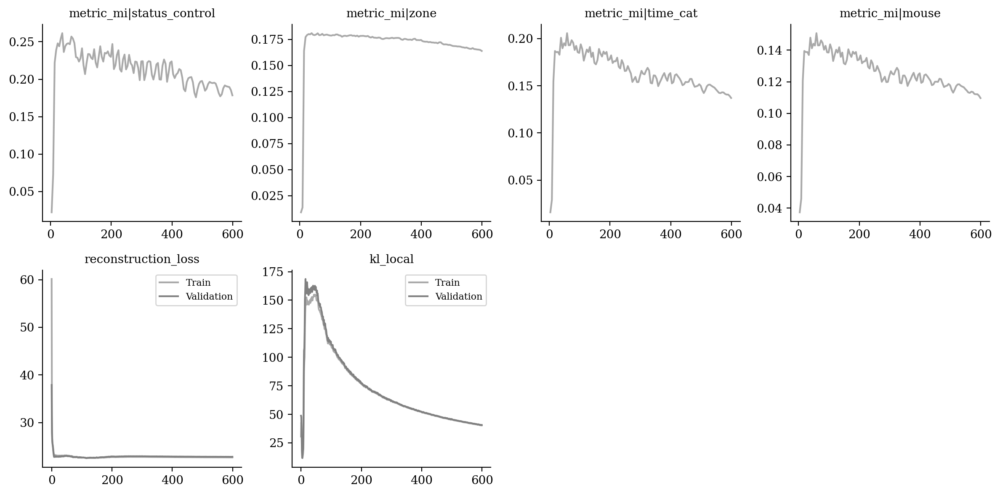

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

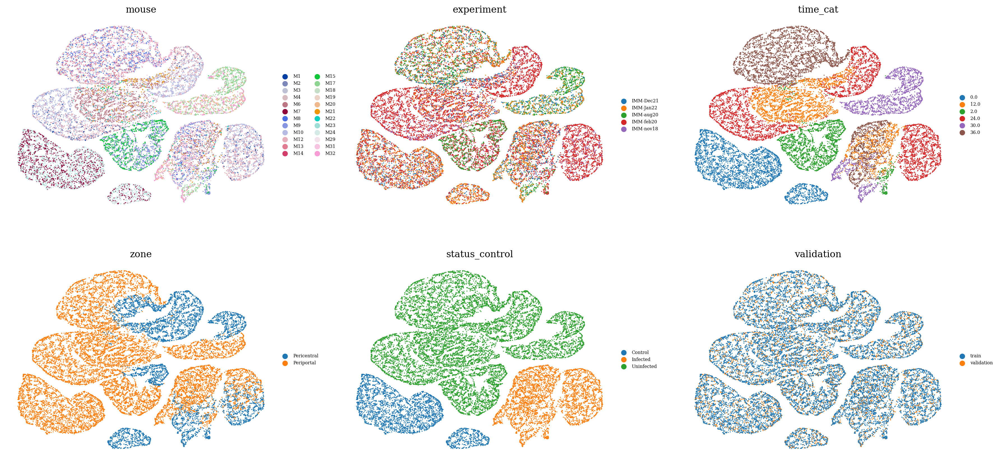

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

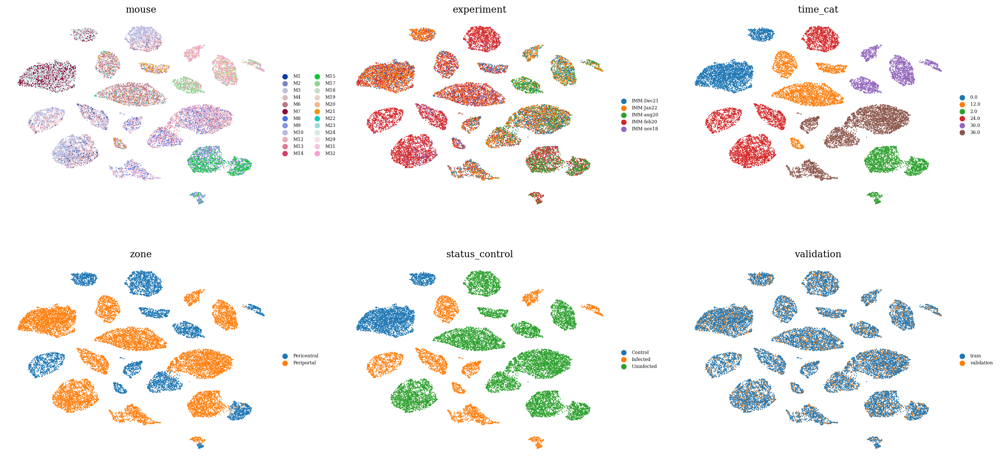

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

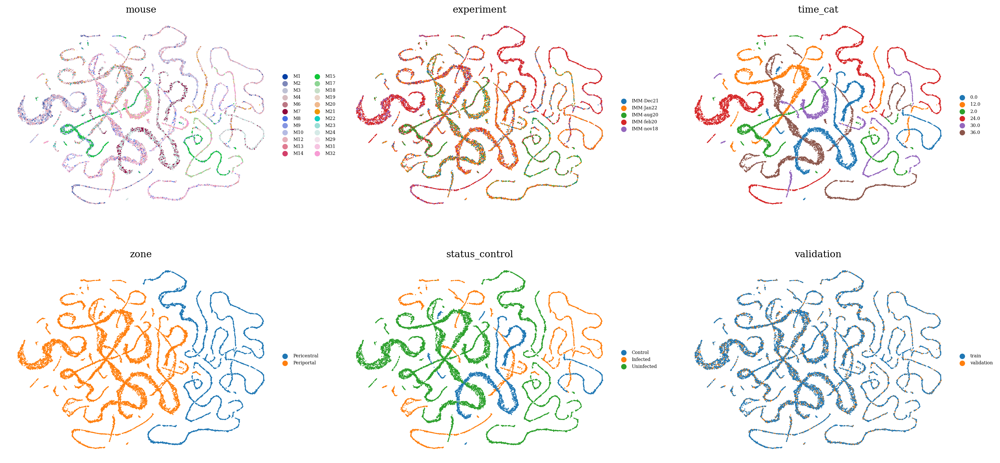

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

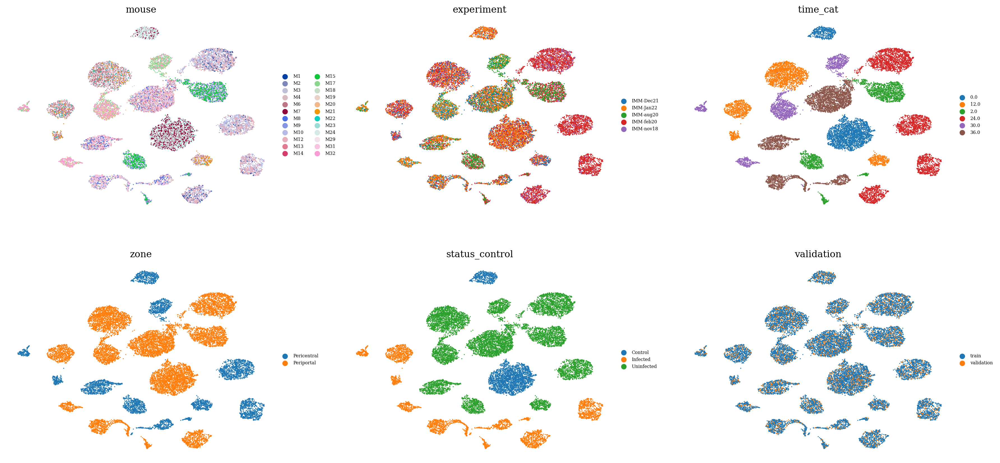

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

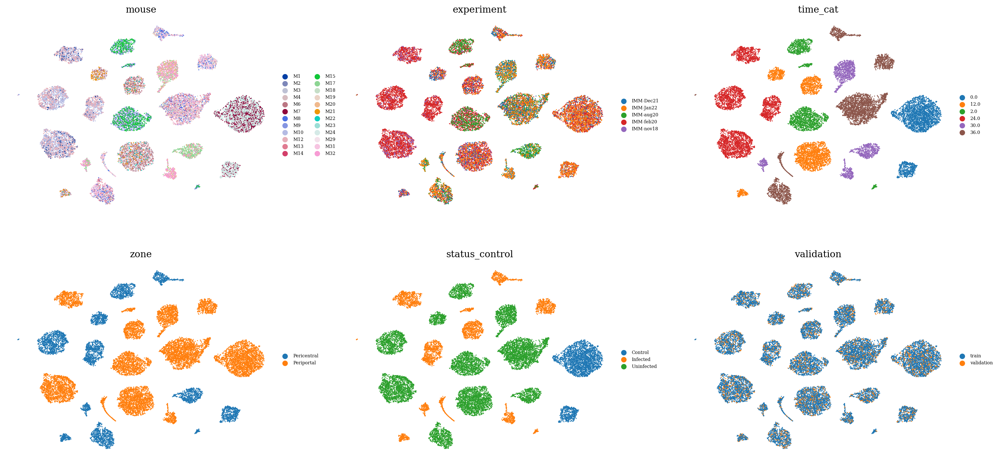

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.6606043094464399

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.6308791476009019

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9962514768008145,
 ('validation', 'unreserved'): 0.29675830869400804,
 ('train', 'reserved'): 0.9961142559854266,
 ('train', 'unreserved'): 0.25477666274011673}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9886777101412851,
 ('validation', 'unreserved'): 0.4392091957070291,
 ('train', 'reserved'): 0.9876045198199552,
 ('train', 'unreserved'): 0.3993886064858371}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.984753864210685,
 ('validation', 'unreserved'): 0.3573314937033975,
 ('train', 'reserved'): 0.9827863128277494,
 ('train', 'unreserved'): 0.2949941253039882}